In [164]:
# -*- coding: utf-8 -*-
import quandl
import numpy as np
import statsmodels.api as sm
from scipy import stats
import matplotlib
from matplotlib import cm, pyplot as plt
from hmmlearn.hmm import GaussianHMM
import scipy
import datetime
import json
import seaborn as sns
# from sklearn.externals import joblib
import pandas as pd
import joblib
from backtest_func import yearsharpRatio, maxRetrace, annROR
import copy

In [165]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [166]:
import warnings
warnings.filterwarnings("ignore")

In [167]:
# 特征工程和建模
def get_best_hmm_model(X, max_states, max_iter=10000):
    best_score = -(10**10)
    best_state = 0

    for state in range(1, max_states + 1):
        hmm_model = GaussianHMM(n_components=state, random_state=100, covariance_type='diag',
                                n_iter=max_iter).fit(X)
        if hmm_model.score(X) > best_score:
            best_score = hmm_model.score(X)
            best_state = state
    best_model = GaussianHMM(n_components=best_state, random_state=100, covariance_type='diag', n_iter=max_iter).fit(X)
    return best_model

# Normalizde
def std_normallized(vals):
    return np.std(vals) / np.mean(vals)


# Ratio of diff
def ma_ratio(vals):
    return (vals[-1] - np.mean(vals)) / vals[-1]


# z-score
def values_deviation(vals):
    return (vals[-1] - np.mean(vals)) / np.std(vals)

## 获取行情数据

In [168]:
data_path = 'C:/e/data/future_index/'
asset = 'IF'
column_price = 'close'
column_high = 'high'
column_low = 'low'
column_volume = 'volume'
data_ori = pd.read_csv(data_path + asset + '_daily_index.csv')
data_ori['date_time'] = data_ori['date_time'].apply(lambda x: pd.to_datetime(x).strftime('%Y-%m-%d'))
data_ori.index = data_ori['date_time']
data_ori['close_1'] = data_ori['close'].shift(1)

### 原始行情数据

In [169]:
data_ori

,date_time,open,high,low,close,volume,close_1
date_time,,,,,,,
2010-04-16,2010-04-16,3474.055,3514.659,3432.499,3435.308,58457.0,NaN
2010-04-19,2010-04-19,3414.444,3416.017,3186.052,3213.307,123612.0,3435.308
2010-04-20,2010-04-20,3221.567,3254.513,3184.809,3229.914,153419.0,3213.307
2010-04-21,2010-04-21,3231.098,3296.184,3222.858,3282.333,121023.0,3229.914
2010-04-22,2010-04-22,3275.504,3288.689,3226.155,3251.239,140307.0,3282.333
...,...,...,...,...,...,...,...
2020-06-29,2020-06-29,4074.453,4084.480,4029.053,4052.892,91772.0,4087.742
2020-06-30,2020-06-30,4073.957,4125.172,4073.318,4095.624,101466.0,4052.892
2020-07-01,2020-07-01,4109.725,4201.148,4103.437,4189.753,129800.0,4095.624


In [170]:
dataset = data_ori.loc[:, ['open', 'high', 'low', 'close', 'volume']].shift(1)

### 训练全集初始状态

In [171]:
dataset

,open,high,low,close,volume
date_time,,,,,
2010-04-16,NaN,NaN,NaN,NaN,NaN
2010-04-19,3474.055,3514.659,3432.499,3435.308,58457.0
2010-04-20,3414.444,3416.017,3186.052,3213.307,123612.0
2010-04-21,3221.567,3254.513,3184.809,3229.914,153419.0
2010-04-22,3231.098,3296.184,3222.858,3282.333,121023.0
...,...,...,...,...,...
2020-06-29,4064.175,4088.278,4057.200,4087.742,84356.0
2020-06-30,4074.453,4084.480,4029.053,4052.892,91772.0
2020-07-01,4073.957,4125.172,4073.318,4095.624,101466.0


### 构建特征因子

In [172]:
# Feature params
future_period = 1
std_period = 10
ma_period = 10
price_deviation_period = 10
volume_deviation_period = 10
# Create features
cols_features = ['last_return', 'std_normalized', 'ma_ratio', 'price_deviation', 'volume_deviation']
dataset['last_return'] = dataset.loc[:, [column_price]].pct_change()
dataset['std_normalized'] = dataset.loc[:, [column_price]].rolling(std_period).apply(std_normallized, raw=True)
dataset['ma_ratio'] = dataset.loc[:, [column_price]].rolling(ma_period).apply(ma_ratio, raw=True)
dataset['price_deviation'] = dataset.loc[:, [column_price]].rolling(price_deviation_period).apply(values_deviation, raw=True)
dataset['volume_deviation'] = dataset.loc[:, [column_price]].rolling(volume_deviation_period).apply(values_deviation, raw=True)
dataset['future_return'] = dataset.loc[:, [column_price]].pct_change(future_period).shift(-future_period)
dataset = dataset.replace([np.inf, -np.inf], np.nan)
dataset = pd.concat([dataset[cols_features], dataset[['future_return']]], axis=1)

In [173]:
dataset = pd.concat([dataset, data_ori[['high', 'low', 'close', 'volume', 'open', 'date_time', 'close_1']]], axis=1)
#日涨跌幅，模型训练的Y值
dataset['ret'] = dataset['open'].shift(-1) / dataset['open'] - 1
dataset['ret'] = dataset['ret'].fillna(0)
dataset = dataset.dropna()

### 加入特征因子后的全集

In [174]:
dataset

,last_return,std_normalized,ma_ratio,price_deviation,volume_deviation,future_return,high,low,close,volume,open,date_time,close_1,ret
date_time,,,,,,,,,,,,,,
2010-04-30,-0.014021,0.026570,-0.040364,-1.460209,-1.460209,0.006797,3137.126,3062.854,3125.241,193380.0,3121.069,2010-04-30,3104.143,-0.006414
2010-05-04,0.006797,0.017822,-0.023420,-1.284054,-1.284054,-0.009188,3113.894,3081.482,3096.525,157571.0,3101.050,2010-05-04,3125.241,-0.010365
2010-05-05,-0.009188,0.020164,-0.029139,-1.404177,-1.404177,-0.000221,3105.629,3052.128,3095.842,153710.0,3068.908,2010-05-05,3096.525,0.009320
2010-05-06,-0.000221,0.021349,-0.025035,-1.144052,-1.144052,-0.033840,3102.218,2978.324,2991.078,181699.0,3097.511,2010-05-06,3095.842,-0.047372
2010-05-07,-0.033840,0.024379,-0.051200,-1.997873,-1.997873,-0.023760,2980.250,2888.371,2920.009,256676.0,2950.777,2010-05-07,2991.078,-0.006576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-24,0.003263,0.013954,0.020394,1.491981,1.491981,0.009196,4088.278,4057.200,4087.742,84356.0,4064.175,2020-06-24,4050.493,0.002529
2020-06-29,0.009196,0.016602,0.026469,1.637670,1.637670,-0.008525,4084.480,4029.053,4052.892,91772.0,4074.453,2020-06-29,4087.742,-0.000122
2020-06-30,-0.008525,0.016448,0.014723,0.908532,0.908532,0.010544,4125.172,4073.318,4095.624,101466.0,4073.957,2020-06-30,4052.892,0.008780


## 样本内隐状态分析

In [175]:
def analyse_hidden_state_of_single_factor(dataset, factor_list, max_states):
    dataset['date_time'] = pd.to_datetime(dataset['date_time'])
    for i in factor_list:
        net_new = copy.deepcopy(dataset)
        net_new[i] = dataset[i]
        X = np.column_stack([net_new[i]])
        model = get_best_hmm_model(X, max_states)
        hidden_states = model.predict(X)
        plt.figure(figsize=(15, 8))
        plt.rcParams['font.sans-serif'] = ['SimHei']
        for k in range(model.n_components):
            idx = (hidden_states == k)
            idx_int = idx.astype(int)
            net_new['%dth_hidden_state' % k] = idx_int
            net_new['%dth_ret' % k] = net_new['%dth_hidden_state' % k] * net_new['ret']
            net_new['%dth_net' % k] = net_new['%dth_ret' % k].cumsum()
            # print(idx)
            plt.title('特征%s标记在收盘价序列上的隐状态' % i)
            plt.plot_date(net_new['date_time'][idx], net_new['close'][idx], '.', label='%dth hidden state' % k, lw=1)
            
            # plt.legend()
            # plt.grid(1)
        plt.tight_layout()
#         plt.savefig('c:/e/' + 'fig/%s.png' % i)
        plt.figure(figsize=(15, 8))
        colnume_name = ['%dth_net' % k for k in range(model.n_components)]
        colnume_name.append('date_time')
        plt.plot(net_new[colnume_name].set_index(['date_time']))
#         net_new[colnume_name].set_index(['date_time']).plot()
        plt.rcParams['font.sans-serif'] = ['SimHei']
        matplotlib.rcParams['axes.unicode_minus'] = False
        plt.title('特征%s各个隐状态多头累计收益' % i)
        plt.tight_layout()
#         plt.savefig('c:/e/' + 'fig/%s_cum_ret.png' % i)

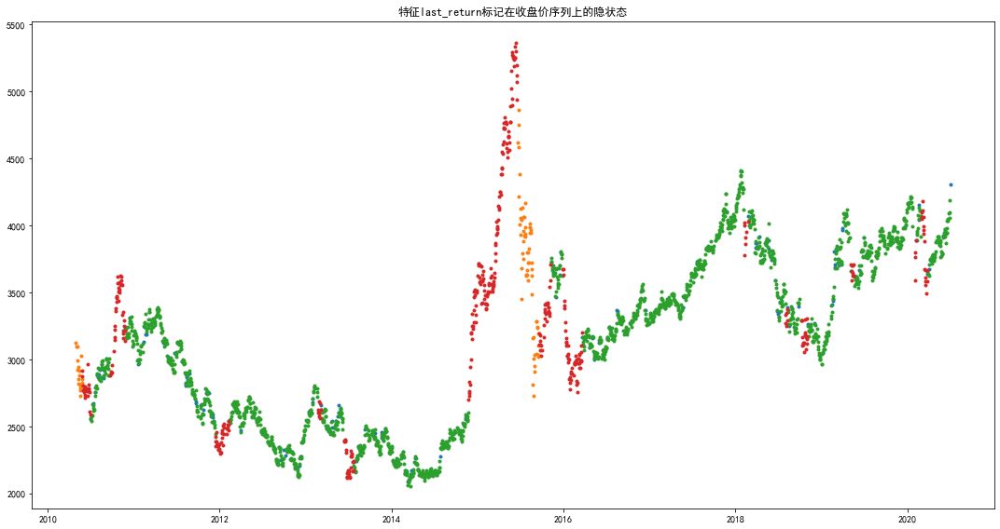

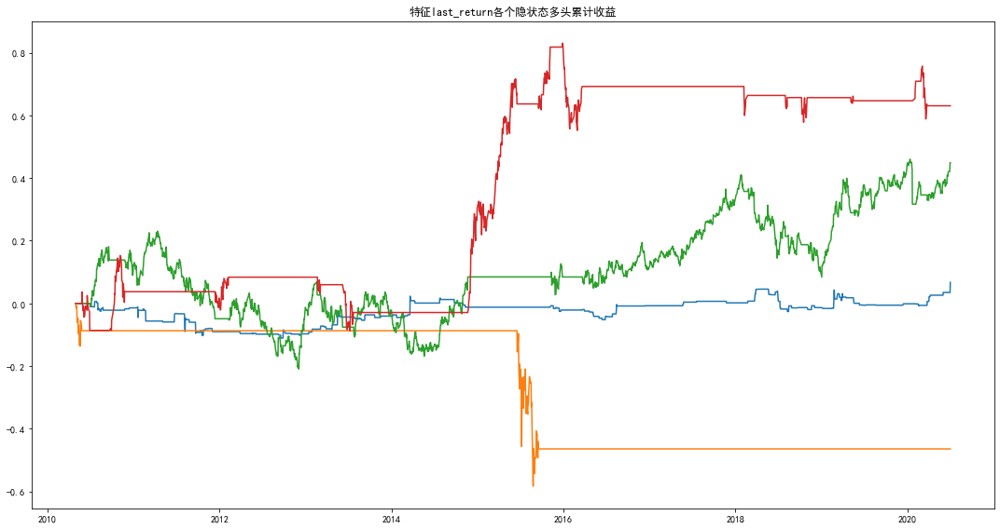

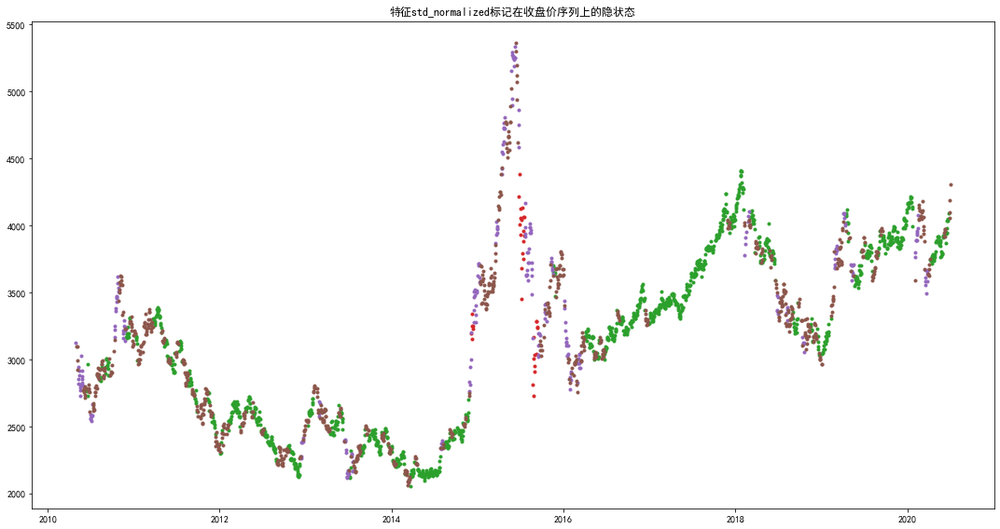

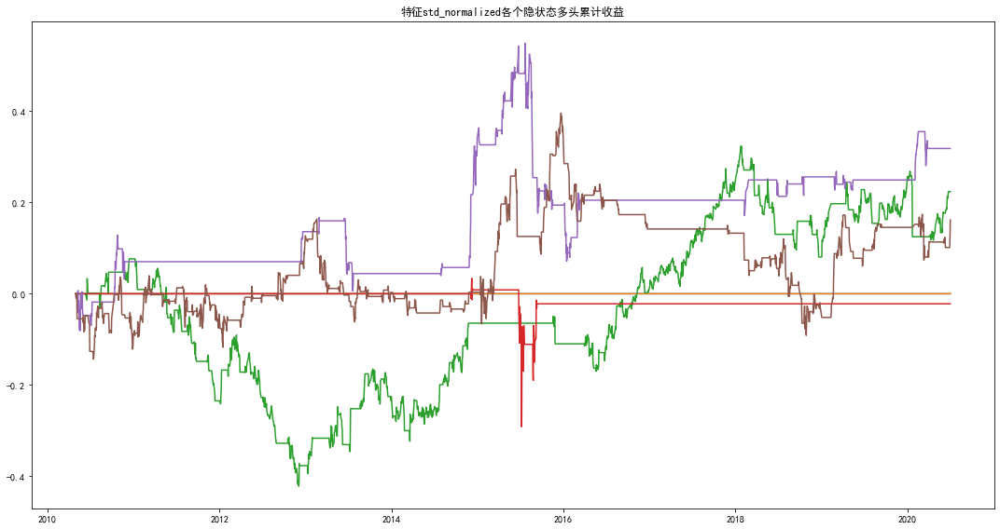

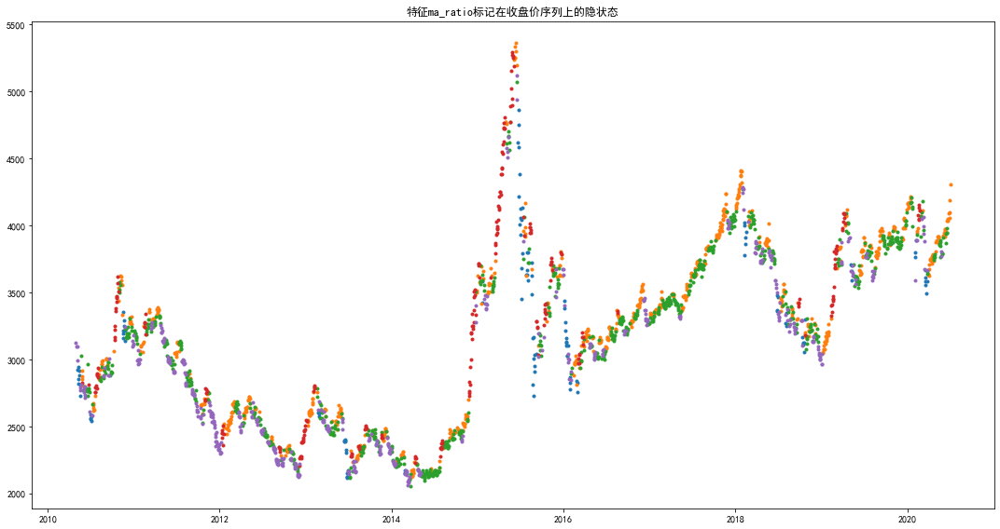

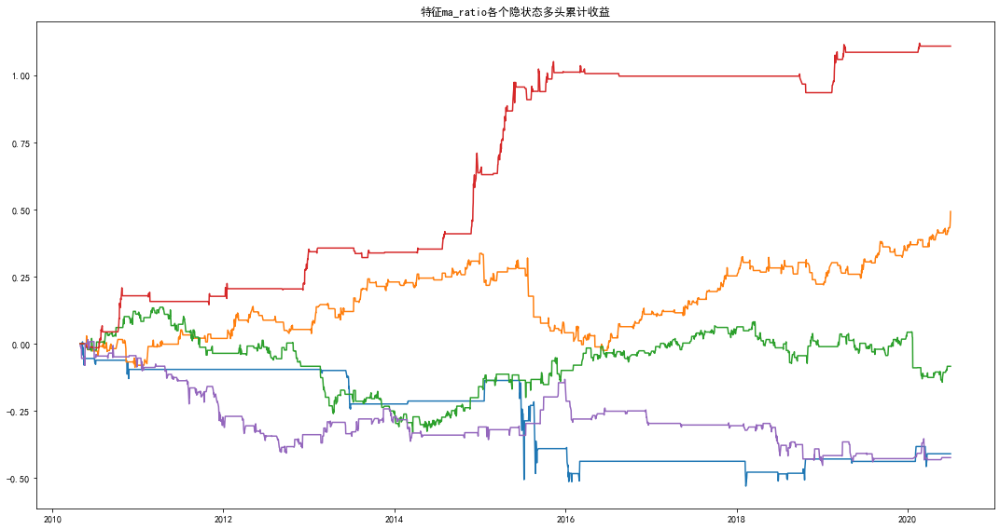

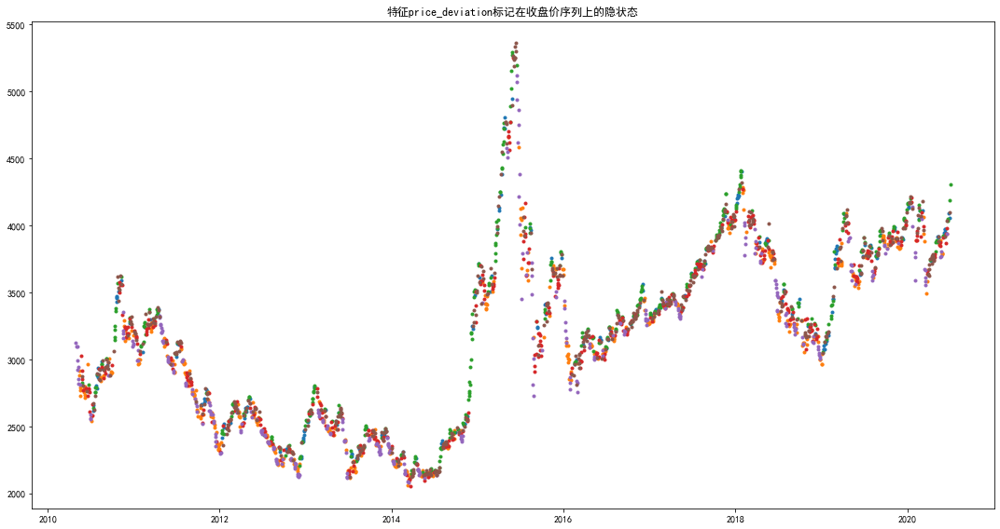

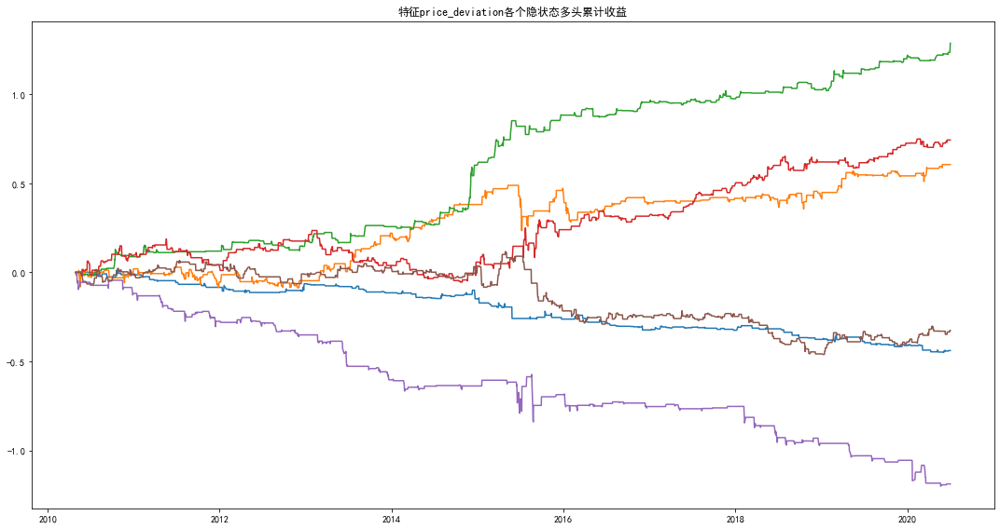

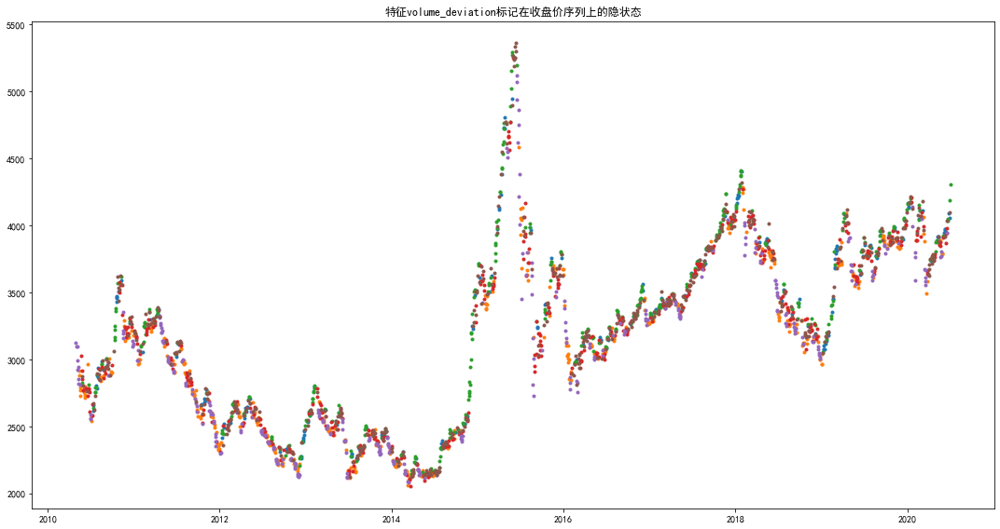

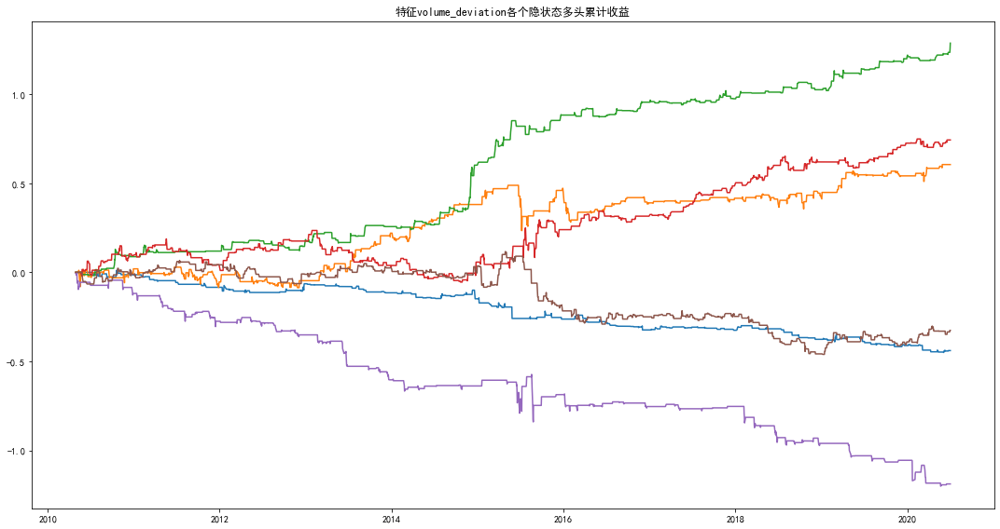

In [176]:
max_states = 6 #隐状态个数设置
analyse_hidden_state_of_single_factor(dataset, cols_features, max_states)

In [188]:
class HmmStrategy(object):
    def __init__(self, s_date, max_states, leverage, fee, data_set, cols_features, train_days=90, test_days=60,
                 insample=False, **kwargs):
        self.s_date=s_date
        self.test_days=test_days
        self.train_days=train_days
        self.max_states=max_states
        self.leverage=leverage
        self.fee=fee
        self.data_set=data_set
        self.cols_features=cols_features
        self.insample = insample
        self.ret = pd.DataFrame()
        self.signal_state_all = pd.DataFrame()
        self.annR = 0
        self.sharp = 0
        self.max_retrace = 0
    
    # 隐状态定义涨跌：单一状态下累计损益为正即为看涨信号，反之为看跌信号
    def get_longshort_state_from_cumsum(self, dataset):
        dataset['date_time'] = pd.to_datetime(dataset['date_time'])
        net_new = copy.deepcopy(dataset).dropna()
        X = np.column_stack([net_new.loc[:, self.cols_features]])
        model = self.get_best_hmm_model(X)
        hidden_states = model.predict(X)
        long_states = []
        short_states = []
        random_states = []
        for k in range(model.n_components):
            idx = (hidden_states == k)
            idx_int = idx.astype(int)
            net_new['%dth_hidden_state' % k] = idx_int
            net_new['%dth_ret' % k] = net_new['%dth_hidden_state' % k] * net_new['ret']
            if net_new['%dth_ret' % k].sum() > 0:
                long_states.append(k)
            elif net_new['%dth_ret' % k].sum() < 0:
                short_states.append(k)
            elif net_new['%dth_ret' % k].sum() == 0:
                random_states.append(k)
#         print('做多隐状态：%s, 做空隐状态：%s, 空仓隐状态：%s' %(long_states, short_states, random_states))
        return model, hidden_states, long_states, short_states, random_states
    
    
    def get_best_hmm_model(self, X, max_iter=10000):
        best_score = -(10**10)
        best_state = 0
        for state in range(1, self.max_states + 1):
            hmm_model = GaussianHMM(n_components=state, random_state=100, covariance_type='diag',
                                    n_iter=max_iter).fit(X)
            if hmm_model.score(X) > best_score:
                best_score = hmm_model.score(X)
                best_state = state
        best_model = GaussianHMM(n_components=best_state, random_state=100, covariance_type='diag', n_iter=max_iter).fit(X)
        return best_model
    
    def handle_data(self, test_set, model, hidden_states, long_states, short_states, random_states):
        test_set['state'] = hidden_states[-len(test_set):]
        fee = self.fee
        state = None 
        signal_lst = []
        trad_times = 0
        chg = 0
        chg_lst = []
        pos_lst = []
        pos = 0
        low_price_pre = 0
        high_price_pre = 100000000
        long_stop = False
        short_stop = False
        state_lst = []
        for idx, _row in test_set.iterrows():
            test_data = test_set[self.cols_features].loc[:idx, :]
            state = _row.state
            state_lst.append(state)
            if pos == 0:
                if state in long_states:
                    pos = 1    
                    cost = _row.open * (1 + fee)
                    s_time = _row.date_time
                    hold_price = []
                    high_price = []
                    hold_price.append(cost/(1+fee))
                    high_price.append(cost/(1+fee))
                    high_price.append(_row.high)
                    chg = (pos * _row.close / cost + (1 - pos)) - 1 
                elif state in short_states:
                    cost = _row.open * (1 - fee)
                    pos = -1
                    s_time = _row.date_time
                    hold_price = []
                    low_price = []
                    hold_price.append(cost/(1-fee))
                    low_price.append(cost/(1-fee))
                    low_price.append(_row.low)
                    chg = ((1 + pos) - pos * (2 - _row.close / cost)) - 1
                else:
                    chg = 0
            elif pos > 0:
                if state in short_states:
                    s_price = _row.open * (1 - fee)
                    trad_times += 1
                    net1 = pos * s_price / _row.close_1 + (1 - pos)
                    ret = s_price / cost - 1
                    e_time = _row.date_time
                    signal_row = []
                    signal_row.append(s_time)
                    signal_row.append(e_time)
                    signal_row.append(cost)
                    signal_row.append(s_price)
                    signal_row.append(ret)
                    signal_row.append((max(high_price) / cost) - 1)
                    signal_row.append(len(hold_price))
                    signal_row.append(pos)
                    signal_row.append('spk')
                    signal_lst.append(signal_row)
                    s_time = _row.date_time
                    cost = s_price
                    pos = -1
                    net2 = (1 + pos) - pos * (2 - _row.close / cost)
                    hold_price = []
                    low_price = []
                    hold_price.append(cost/(1-fee))
                    low_price.append(cost/(1-fee))
                    low_price.append(_row.low)
                    chg = net1 * net2 - 1
                    short_stop = False
                    long_stop = False
                elif state in random_states:
                    s_price = _row.open * (1 - fee)
                    trad_times += 1
                    net1 = pos * s_price / _row.close_1 + (1 - pos)
                    ret = s_price / cost - 1
                    e_time = _row.date_time
                    signal_row = []
                    signal_row.append(s_time)
                    signal_row.append(e_time)
                    signal_row.append(cost)
                    signal_row.append(s_price)
                    signal_row.append(ret)
                    signal_row.append((max(high_price) / cost) - 1)
                    signal_row.append(len(hold_price))
                    signal_row.append(pos)
                    signal_row.append('sp')
                    signal_lst.append(signal_row)
                    pos = 0
                    high_price.append(_row.high)
                    long_stop = False
                    short_stop = False
                    chg = net1 - 1
                else:
                    high_price.append(_row.high)
                    hold_price.append(_row.close)
                    chg = (pos * _row.close / _row.close_1 + (1 - pos)) - 1
            elif pos < 0:
                if state in long_states:
                    b_price = _row.open * (1 + fee)
                    e_time = _row.date_time
                    trad_times += 1
                    net1 = (1 + pos) - pos * (2 - b_price / _row.close_1)
                    ret = (cost - b_price) / cost
                    signal_row = []
                    signal_row.append(s_time)
                    signal_row.append(e_time)
                    signal_row.append(cost)
                    signal_row.append(b_price)
                    signal_row.append(ret)
                    signal_row.append((cost - min(low_price)) / cost)
                    signal_row.append(len(hold_price))
                    signal_row.append(pos)
                    signal_row.append('bpk')
                    signal_lst.append(signal_row)
                    pos = 1
                    cost = b_price
                    net2 = pos * _row.close / cost + 1 - pos
                    s_time = _row.date_time
                    hold_price = []
                    high_price = []
                    hold_price.append(cost/(1+fee))
                    high_price.append(cost/(1+fee))
                    high_price.append(_row.high)
                    chg = net1 * net2 - 1
                    short_stop = False
                    long_stop = False
                elif state in random_states:
                    b_price = _row.open * (1 + fee)
                    trad_times += 1
                    net1 = (1 + pos) - pos * (2 - b_price / _row.close_1)
                    ret = (cost - b_price) / cost
                    e_time = _row.date_time
                    signal_row = []
                    signal_row.append(s_time)
                    signal_row.append(e_time)
                    signal_row.append(cost)
                    signal_row.append(b_price)
                    signal_row.append(ret)
                    signal_row.append((cost - min(low_price)) / cost)
                    signal_row.append(len(hold_price))
                    signal_row.append(pos)
                    signal_row.append('bp')
                    signal_lst.append(signal_row)
                    pos = 0
                    low_price.append(_row.low)
                    long_stop = False
                    short_stop = False
                    chg = net1 - 1

                else:
                    low_price.append(_row.low)
                    hold_price.append(_row.close)
                    chg = ((1 + pos) - pos * (2 - _row.close / _row.close_1)) - 1
            chg_lst.append(chg)
            pos_lst.append(pos)
        ret = test_set.loc[:, ['close', 'date_time']]
        ret['chg'] = chg_lst
        ret['pos'] = pos_lst
        ret['state'] = state_lst
        signal_state_all = pd.DataFrame(signal_lst, columns=[
                                's_time', 'e_time', 'b_price', 's_price', 'ret', 'max_ret', 'hold_day',
                                'position', 'bspk'])
        return ret, signal_state_all

    def _analyze(self):
        # Summary output
        ret = self.ret
        ret = ret[ret.index>=self.s_date]
        ret.index = pd.to_datetime(ret.index)
        ret['net_close'] = ret['close'] / ret['close'].tolist()[0]
        ret['net'] = ret['net'] / ret['net'].tolist()[0]
        net_lst = ret['net'].tolist()
        annR = annROR(net_lst, 1)
        sharp = yearsharpRatio(net_lst, 1)
        max_retrace = maxRetrace(net_lst, 1)
        self.annR = annR
        self.sharp = sharp
        self.max_retrace = max_retrace

        f = plt.figure(figsize=(15, 8))
        plt.rcParams['font.sans-serif'] = ['SimHei']

        # Plot return
        ax1 = f.add_subplot(111)
        ax1.plot(ret.net, 'blue', label='net_hmm')
        ax1.plot(ret.net_close, 'red', label='net_close')
        ax1.legend()
        ax1.set_title('特征因子%s训练窗口%s测试窗口%s净值曲线' %(self.cols_features, self.train_days, self.test_days))
        ax1.set_xlabel('Time')
        ax1.set_ylabel('Value')
        

#         # Plot state
#         ax2 = f.add_subplot(212, sharex=ax1)
#         ax2.plot(ret.state, 'grey')
#         ax2.set_title('特征因子%s隐状态' %self.cols_features)
#         ax2.set_xlabel('Time')
#         ax2.set_ylabel('Value')
#         plt.tight_layout()
        

    def _get_ret_insample(self):
        self.insample = True
        ret_df = []
        signal_state_all = []
        train_days = self.train_days
        for i in range(0, len(self.data_set), train_days):
            if i+train_days > len(self.data_set):
                train_set = self.data_set.iloc[-train_days:]
                test_set = self.data_set.iloc[i:]
            else:
                train_set = self.data_set.iloc[i:i+train_days]
                test_set = train_set
            model, hidden_states, long_states, short_states, random_states = self.get_longshort_state_from_cumsum(train_set)
            ret, signal_state = self.handle_data(test_set, model, hidden_states, long_states, short_states, random_states)
            ret_df.append(ret)
            signal_state_all.append(ret)
        ret_df = pd.concat(ret_df)
        ret_df['net'] = (1+ret_df['chg']).cumprod()
        signal_state_all = pd.concat(signal_state_all)
        self.ret = ret_df
        self.signal_state_all = signal_state_all
    
    def _get_ret_outsample(self):
        self.insample = False
        ret_df = []
        signal_state_all = []
        train_days = self.train_days
        test_days = self.test_days
        for i in range(train_days, len(self.data_set), test_days):   
            if i+test_days > len(self.data_set):
                all_set = self.data_set.iloc[i-train_days:i+test_days]
                train_set = self.data_set.iloc[i-train_days:i]
                test_set = self.data_set.iloc[i:]
            else:
                all_set = self.data_set.iloc[i-train_days:i+test_days]
                train_set = self.data_set.iloc[i-train_days:i]
                test_set = self.data_set.iloc[i:i+test_days]
            model, hidden_states, long_states, short_states, random_states = self.get_longshort_state_from_cumsum(train_set)
#             print(len(hidden_states))
            hidden_states_predict = model.predict(test_set[self.cols_features])
#             print(len(hidden_states_predict))
            ret, signal_state = self.handle_data(test_set, model, hidden_states_predict, long_states, short_states, random_states)
            ret_df.append(ret)
            signal_state_all.append(ret)
        ret_df = pd.concat(ret_df)
        ret_df['net'] = (1+ret_df['chg']).cumprod()
        signal_state_all = pd.concat(signal_state_all)
        self.ret = ret_df
        self.signal_state_all = signal_state_all
        
    
    def run_insample(self):
        self._get_ret_insample()
        self._analyze()
        return self.annR, self.sharp, self.max_retrace
        
    def run_outsample(self):
        self._get_ret_outsample()
        self._analyze()
        return self.annR, self.sharp, self.max_retrace
        
    

# 样本内回测

In [179]:
#获取集合的所有子集
def PowerSetsRecursive(items):
    result = [[]]
    for x in items:
        result.extend([subset + [x] for subset in result])
    return result

In [180]:
all_feature_lst = PowerSetsRecursive(cols_features)
all_feature_lst = [i for i in all_feature_lst if len(i)>0]

## 特征因子样本内回测

### 特征因子样本内不同窗口期回测

特征因子： ['price_deviation'] 训练窗口: 60
年化收益: 1.8188155587119095
夏普比率: 3.717313514147036
最大回撤: 0.15421023482157592
特征因子： ['price_deviation'] 训练窗口: 90
年化收益: 1.1937658034835321
夏普比率: 2.7652666855318424
最大回撤: 0.20849897410882212
特征因子： ['price_deviation'] 训练窗口: 120
年化收益: 1.1010946778366701
夏普比率: 2.6395953308230022
最大回撤: 0.25440828866946763
特征因子： ['price_deviation'] 训练窗口: 150
年化收益: 1.0638929556148642
夏普比率: 2.564882521701789
最大回撤: 0.2411925166712432
特征因子： ['price_deviation'] 训练窗口: 180
年化收益: 0.9650544727650447
夏普比率: 2.396221448979554
最大回撤: 0.23266166033154434
特征因子： ['price_deviation'] 训练窗口: 210
年化收益: 1.043120964068117
夏普比率: 2.5727968606979688
最大回撤: 0.2566951673578567
特征因子： ['price_deviation'] 训练窗口: 240
年化收益: 0.8541882358087978
夏普比率: 2.190713158498309
最大回撤: 0.2678963078570794
特征因子： ['price_deviation'] 训练窗口: 270
年化收益: 0.7133970208032367
夏普比率: 1.8875133047791237
最大回撤: 0.25669516735785636
特征因子： ['price_deviation'] 训练窗口: 300
年化收益: 1.049479703158692
夏普比率: 2.5346990345100298
最大回撤: 0.23266166033154445


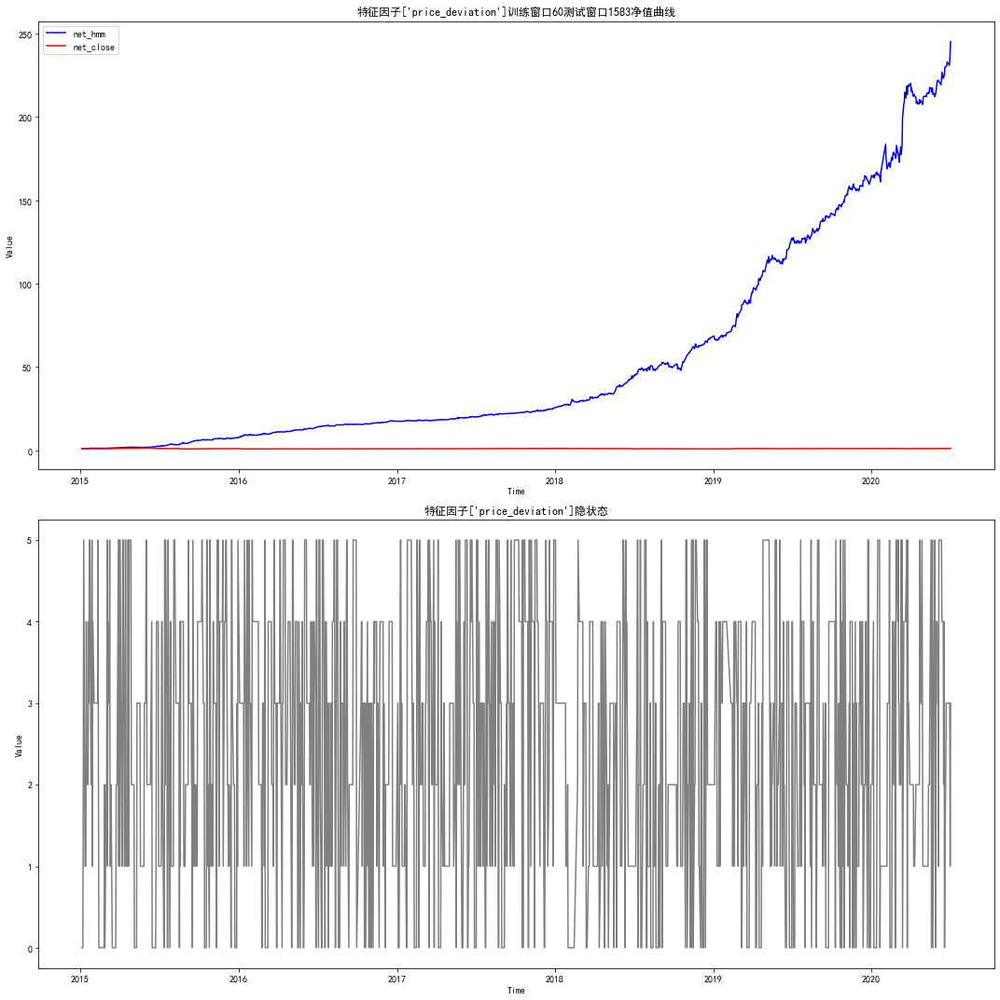

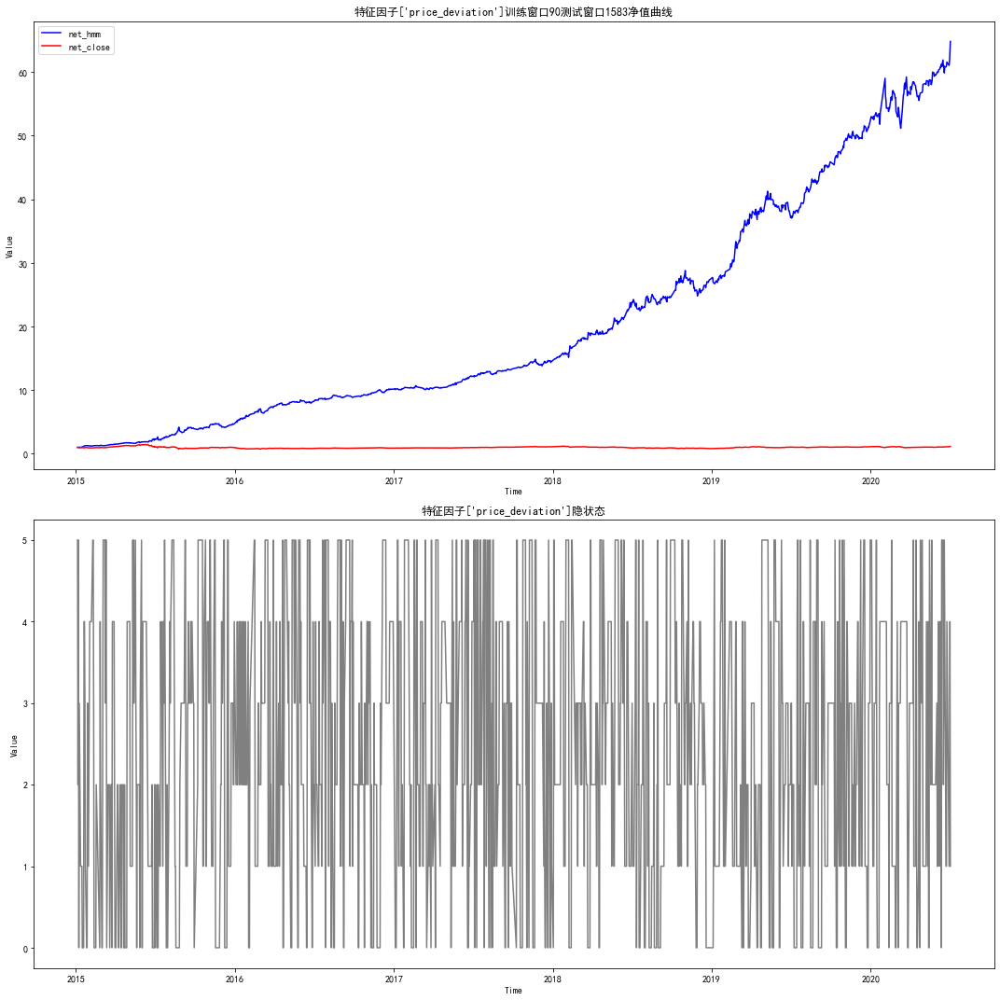

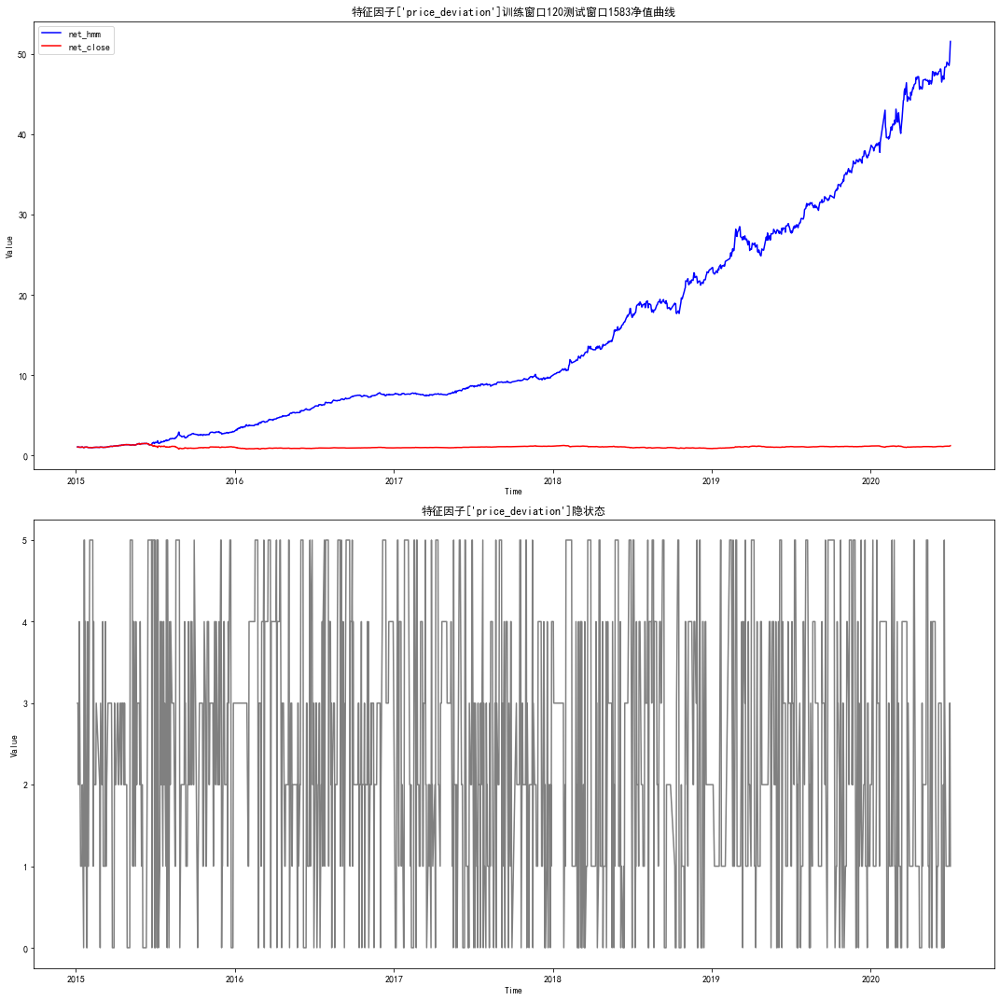

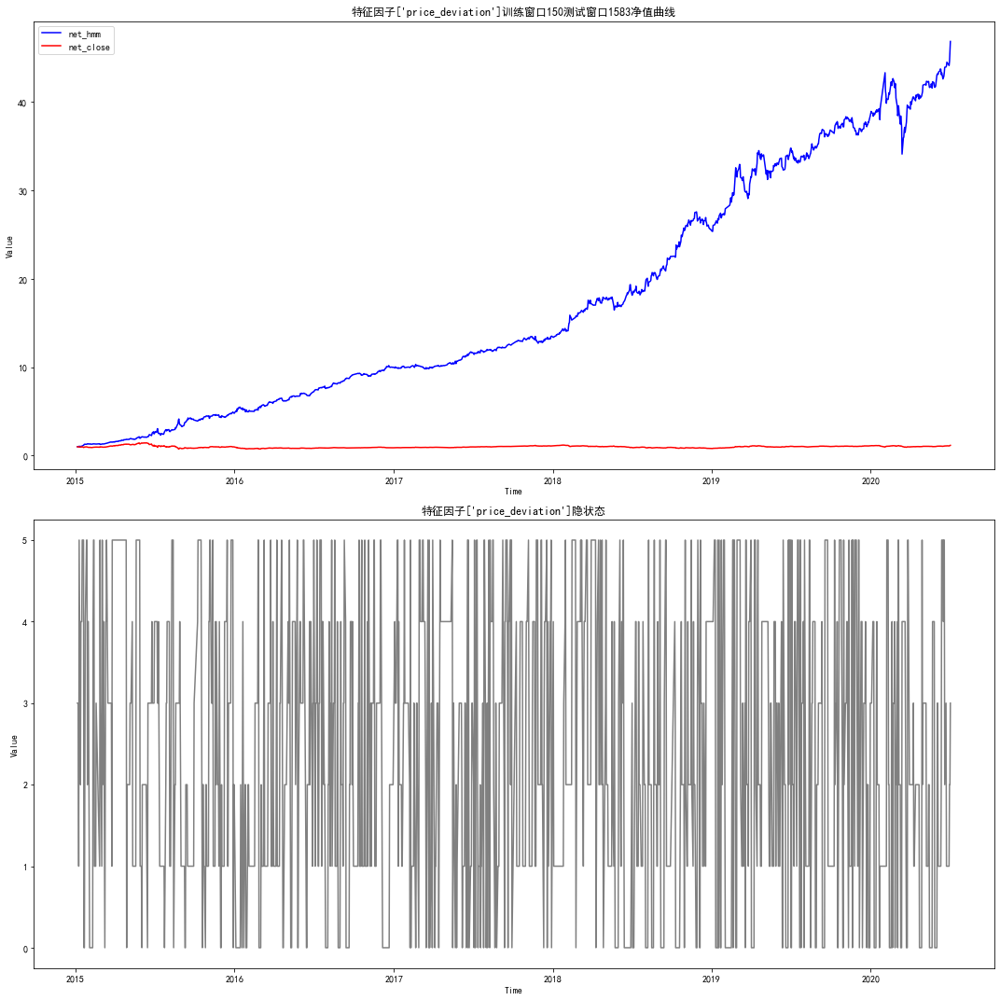

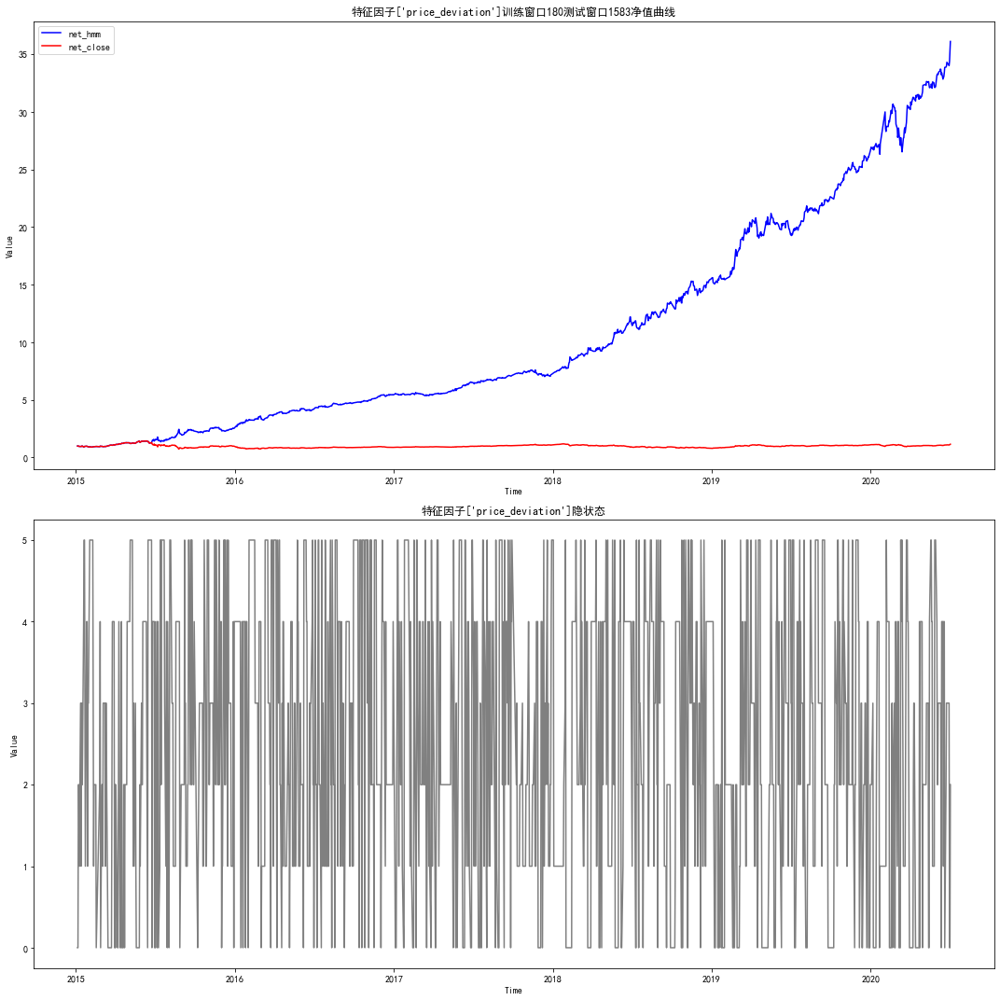

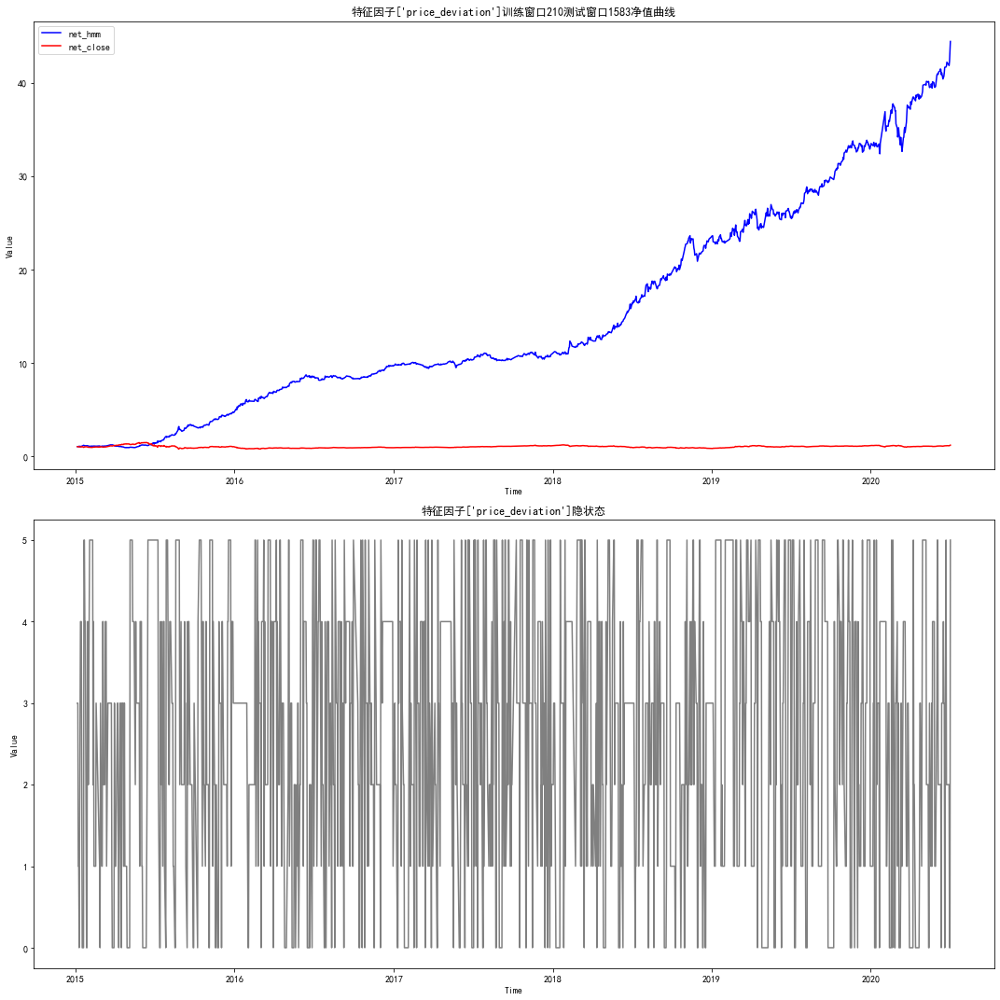

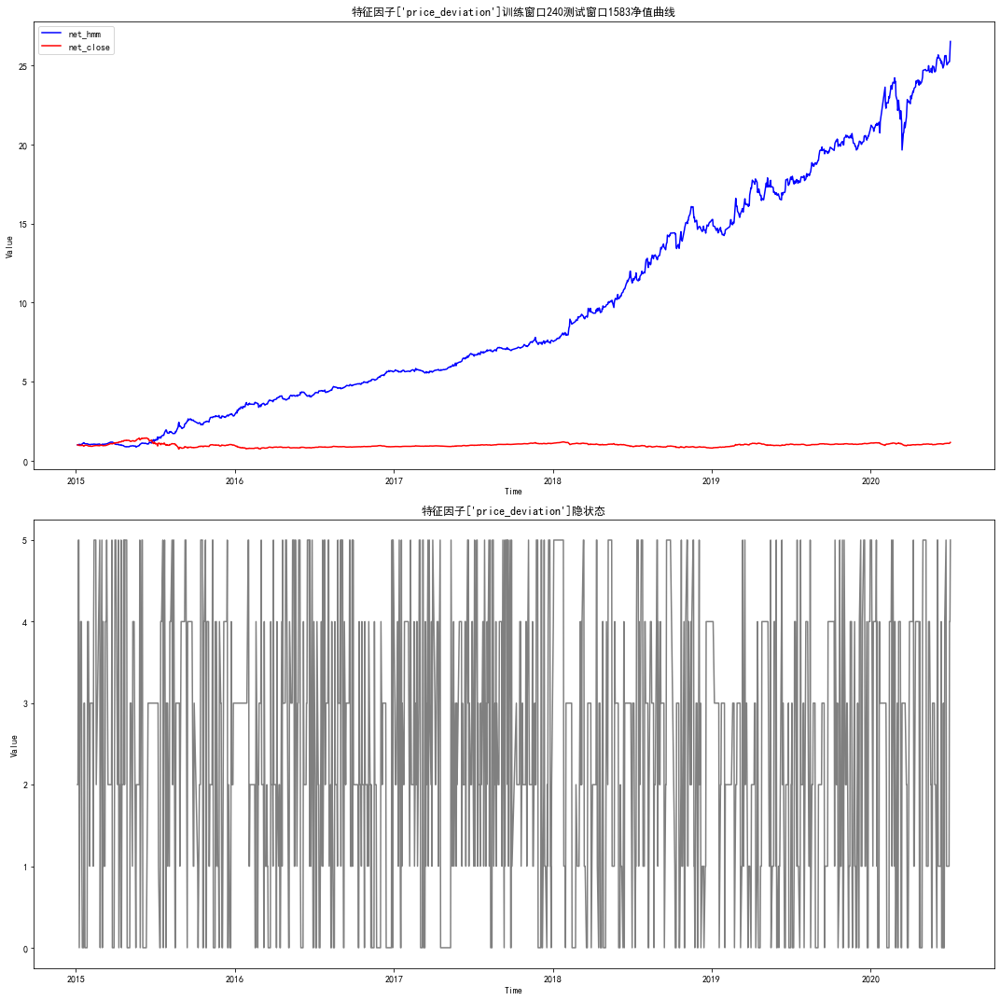

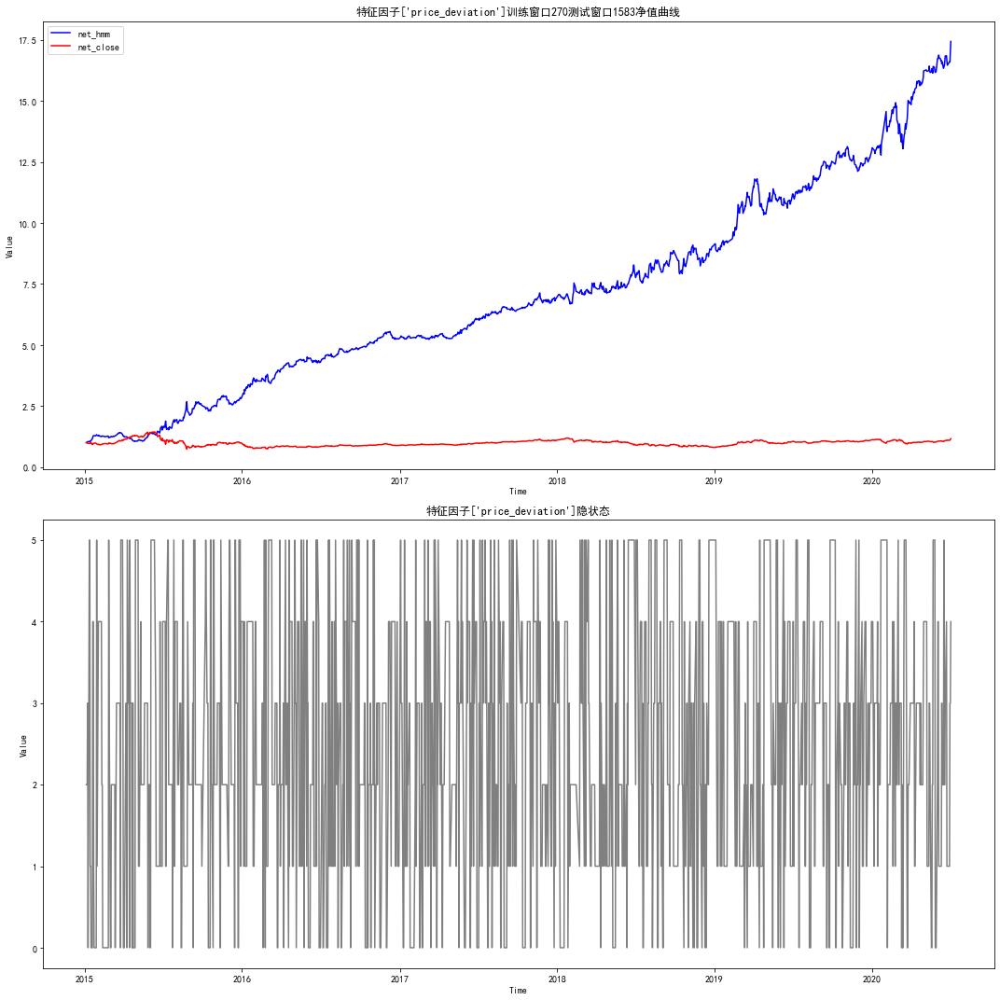

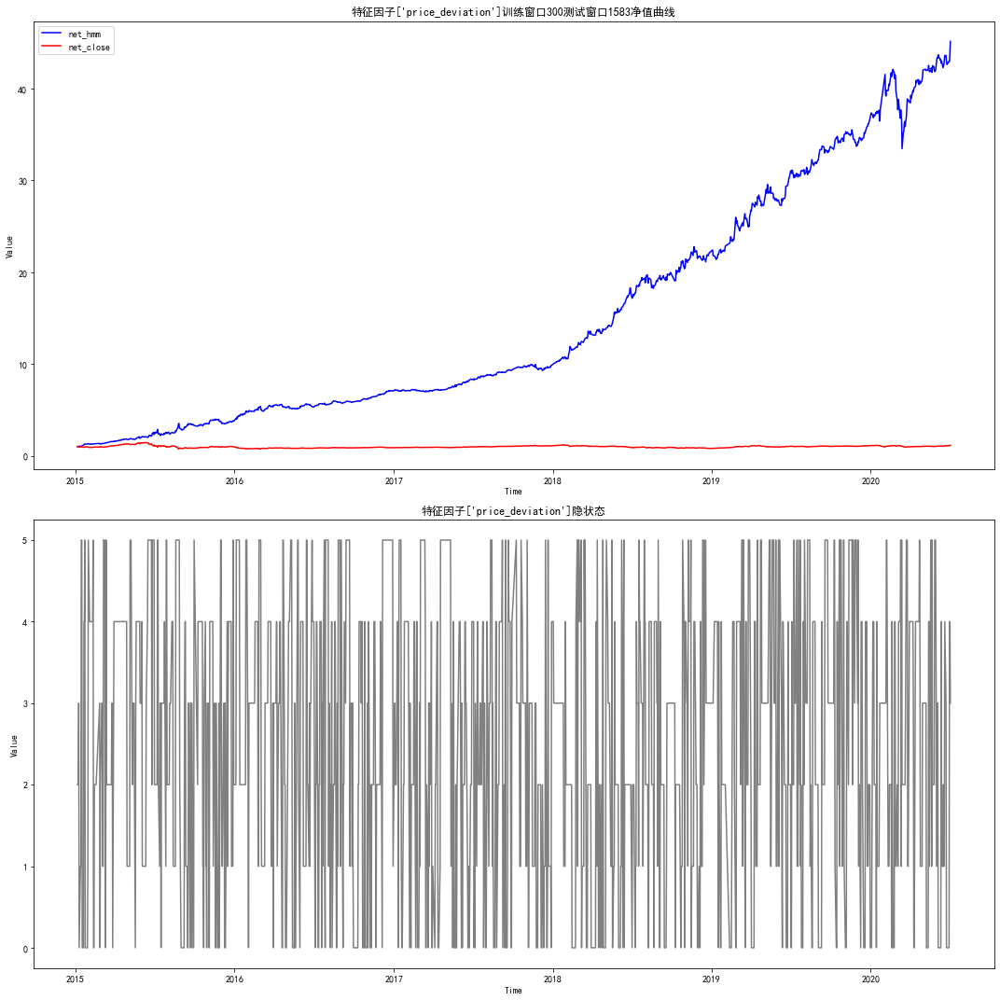

In [181]:
s_date = '2015-01-01'
train_s_date = '2014-01-01'
data_set = dataset[dataset.index >= train_s_date].dropna()
train_days = len(in_sample_dataset)
test_days = len(in_sample_dataset)
all_feature_lst = [['price_deviation']]
for feature_lst in all_feature_lst:
    for train_days in range(60, 301, 30):
        print('特征因子：', feature_lst, '训练窗口:', train_days)
        strategy_obj = HmmStrategy(s_date=s_date, max_states=max_states, leverage=1, fee=0.0002, data_set=data_set, 
                                   cols_features=feature_lst, train_days=train_days, test_days=test_days, insample=True)
        strategy_obj.run_insample()

### 样本内不同特征因子回测

特征因子： ['last_return'] 训练窗口: 90
年化收益: 0.3284727520360886
夏普比率: 0.9868358504792093
最大回撤: 0.32513981153364246
特征因子： ['std_normalized'] 训练窗口: 90
年化收益: 0.32357320524541766
夏普比率: 0.9782279991741788
最大回撤: 0.2315619446057815
特征因子： ['last_return', 'std_normalized'] 训练窗口: 90
年化收益: 0.3320118629073594
夏普比率: 1.0008407788304554
最大回撤: 0.2315619446057815
特征因子： ['ma_ratio'] 训练窗口: 90
年化收益: 0.4767110092508393
夏普比率: 1.3676081474961348
最大回撤: 0.17072759995800213
特征因子： ['last_return', 'ma_ratio'] 训练窗口: 90
年化收益: 0.7050445193534478
夏普比率: 1.8416820498952973
最大回撤: 0.1286308687667177
特征因子： ['std_normalized', 'ma_ratio'] 训练窗口: 90
年化收益: 0.44198586339283796
夏普比率: 1.2902870109420885
最大回撤: 0.19679858311866594
特征因子： ['last_return', 'std_normalized', 'ma_ratio'] 训练窗口: 90
年化收益: 0.4341328678007019
夏普比率: 1.2734951583568983
最大回撤: 0.20640005325933153
特征因子： ['price_deviation'] 训练窗口: 90
年化收益: 1.2586233365784225
夏普比率: 2.899304323628318
最大回撤: 0.1542102348215757
特征因子： ['last_return', 'price_deviation'] 训练窗口: 90
年化收益: 1.2809748486

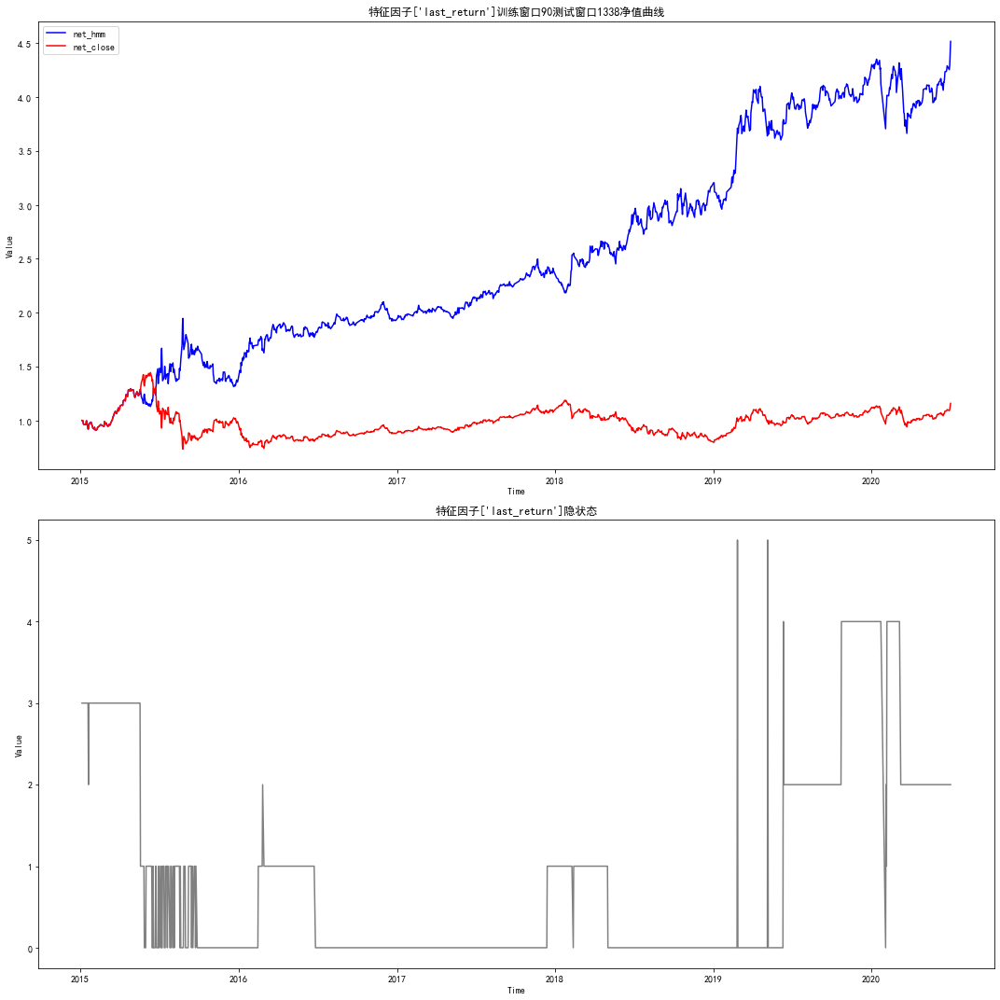

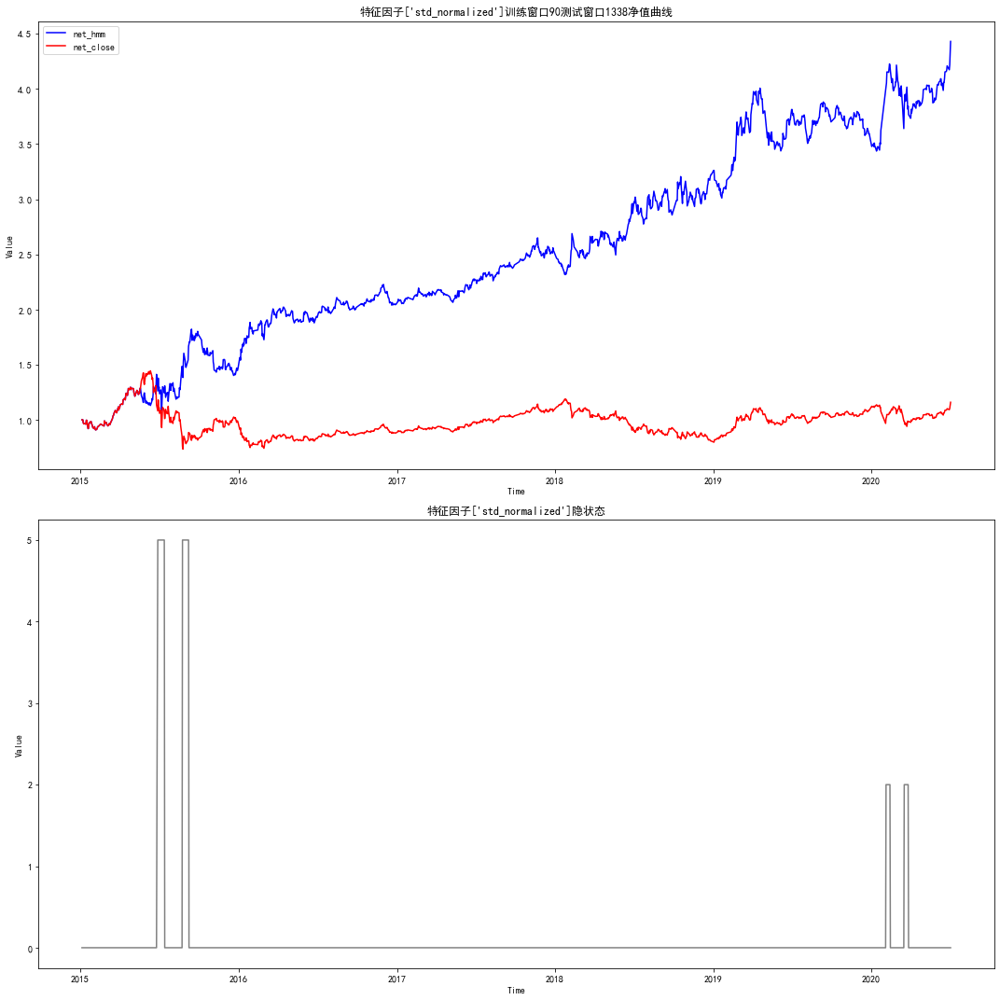

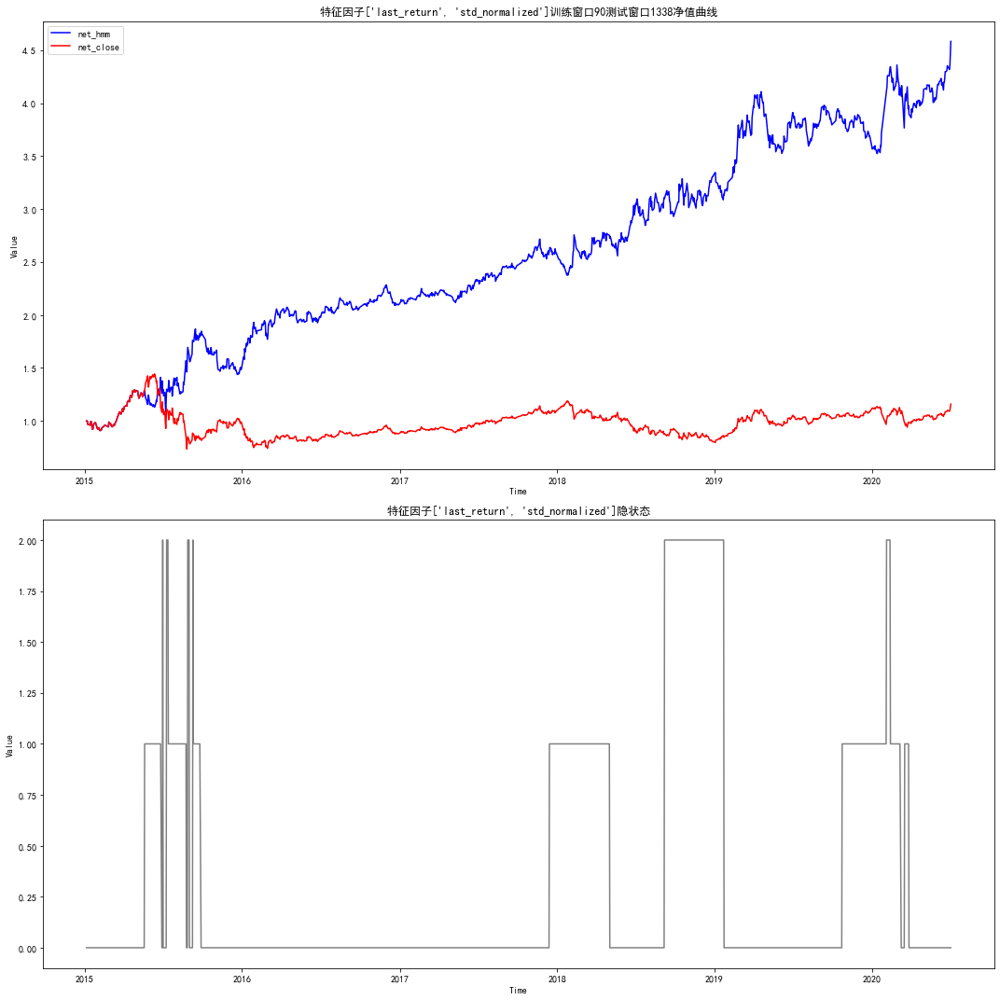

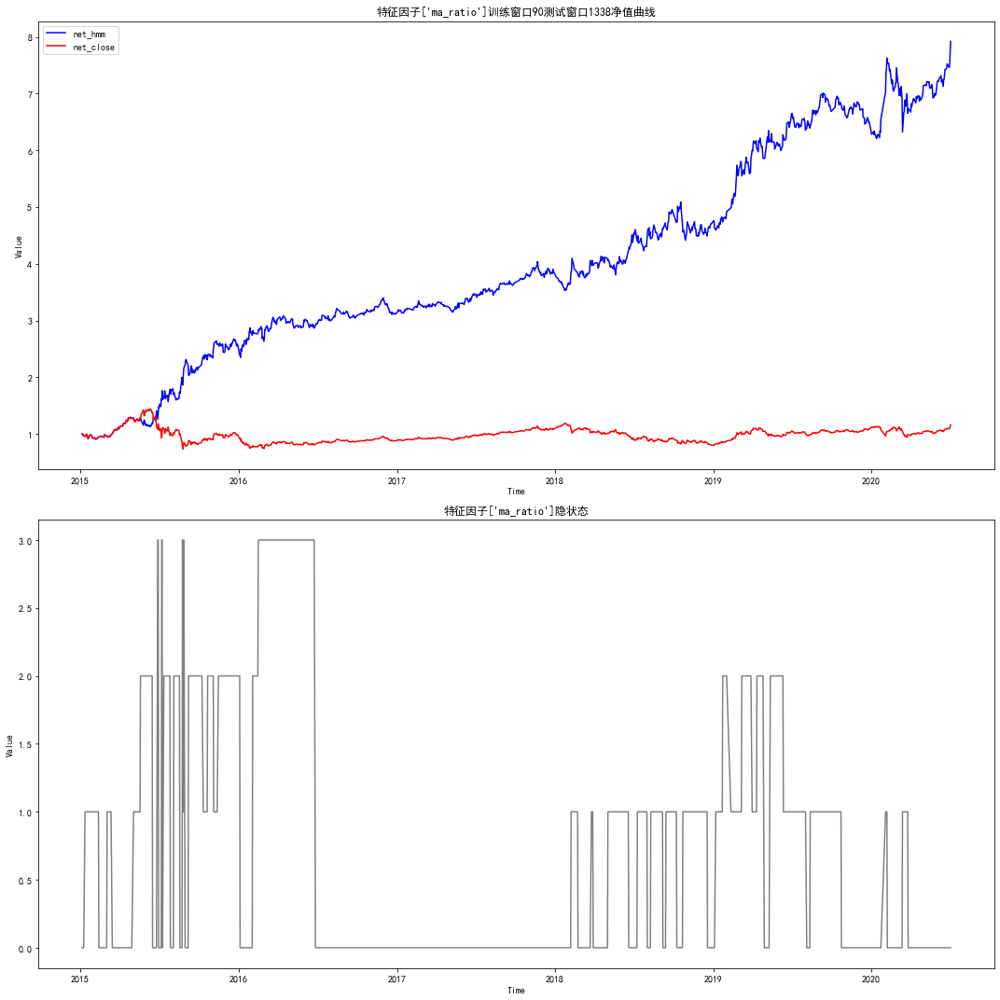

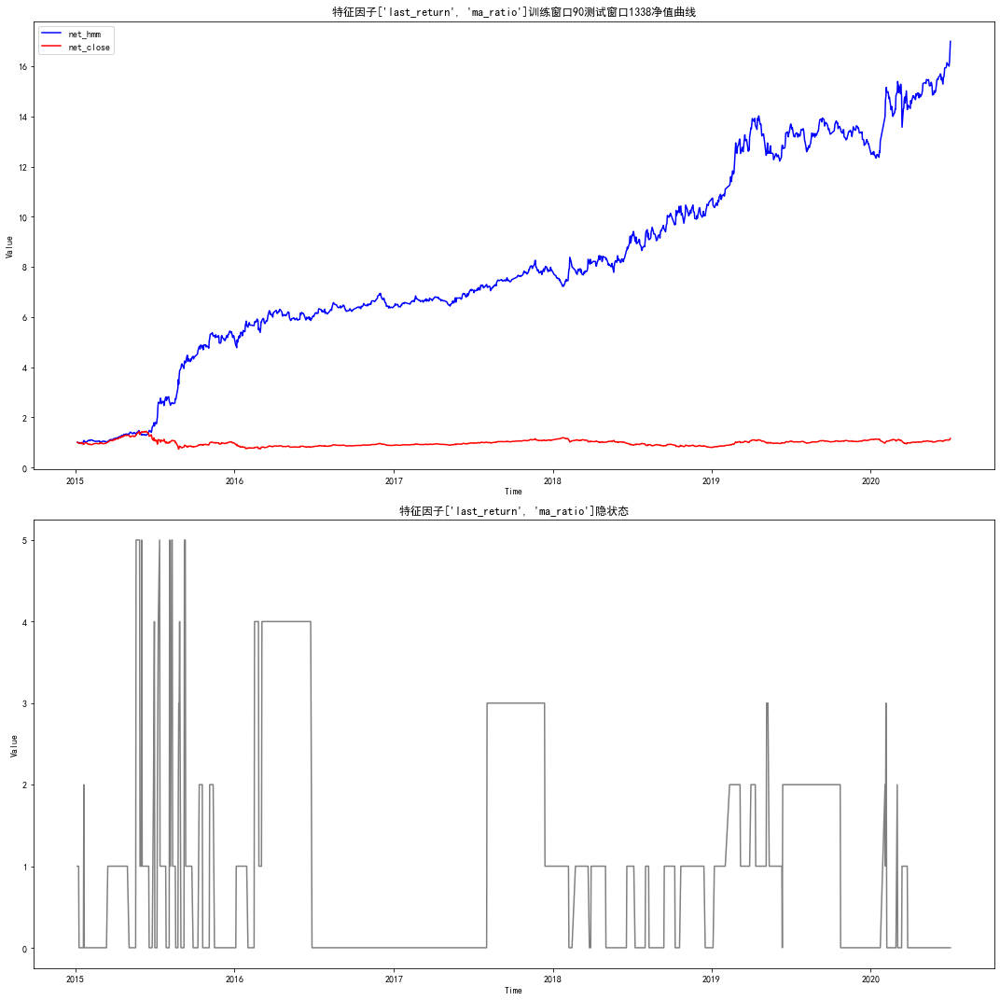

...

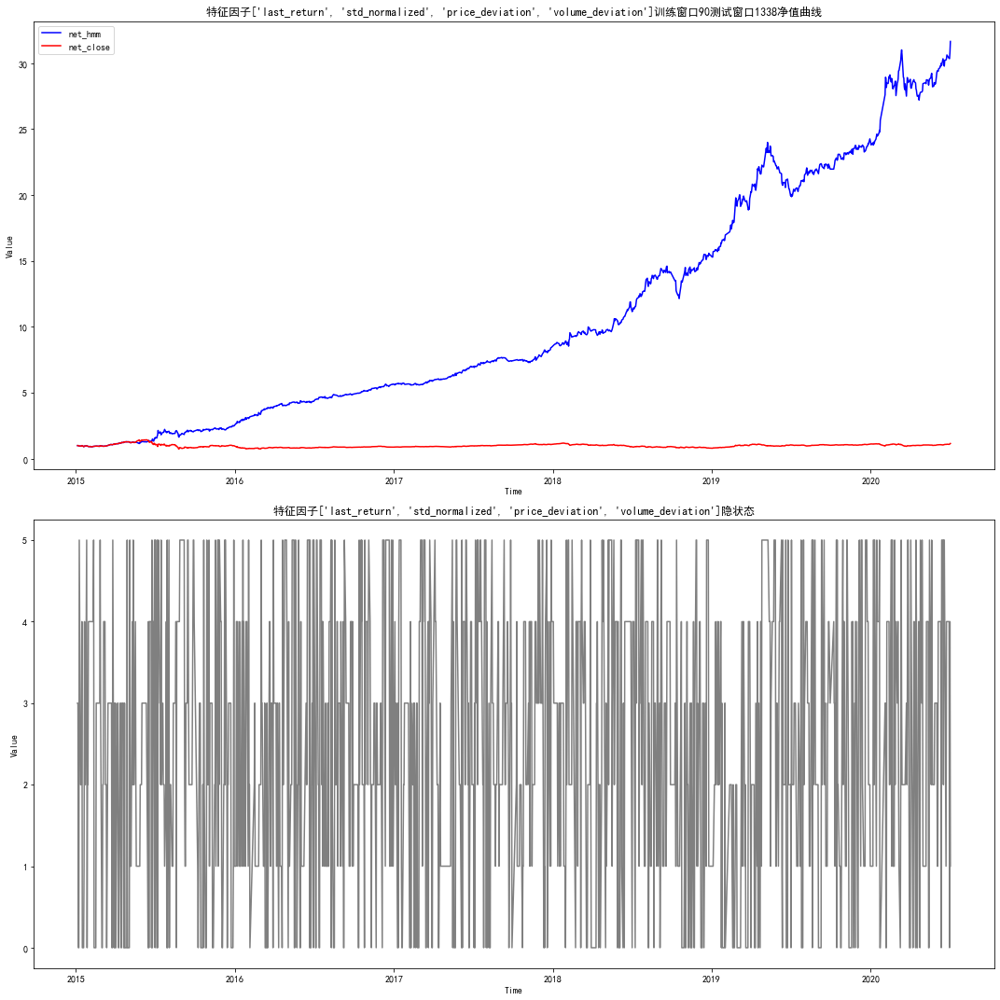

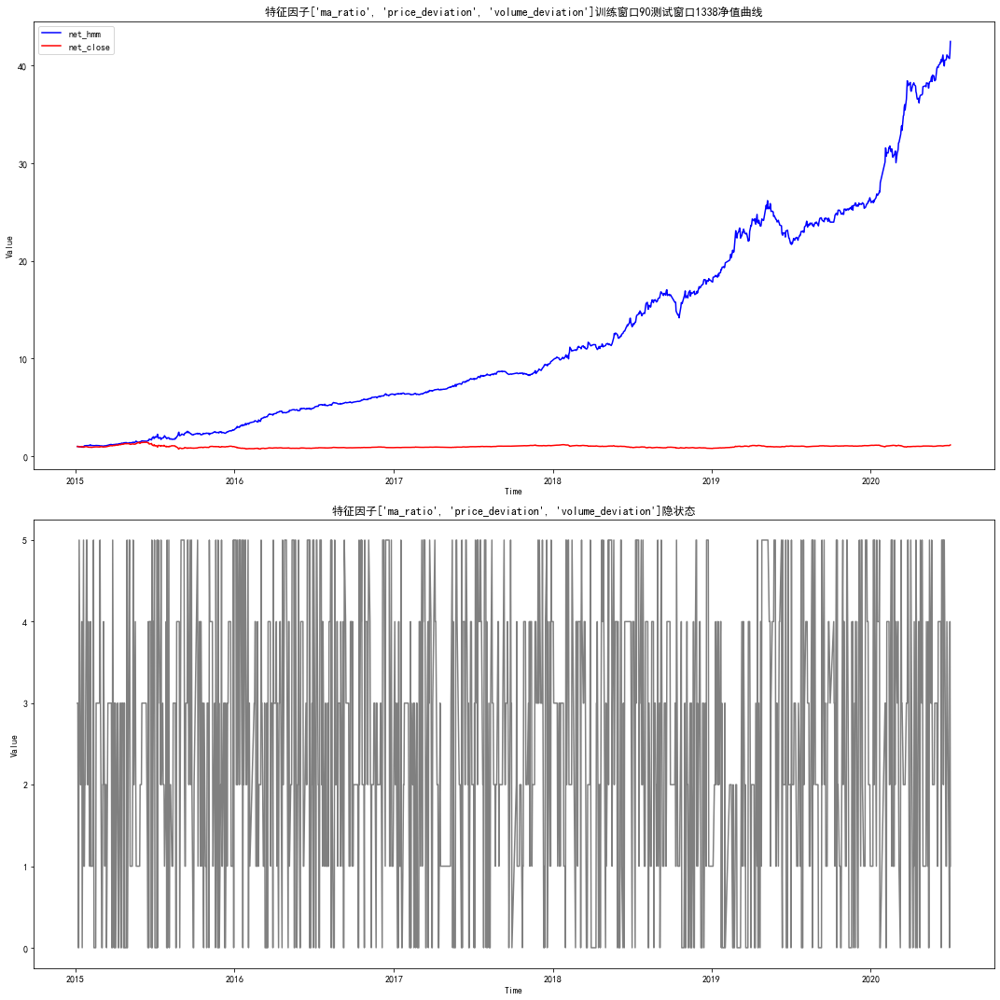

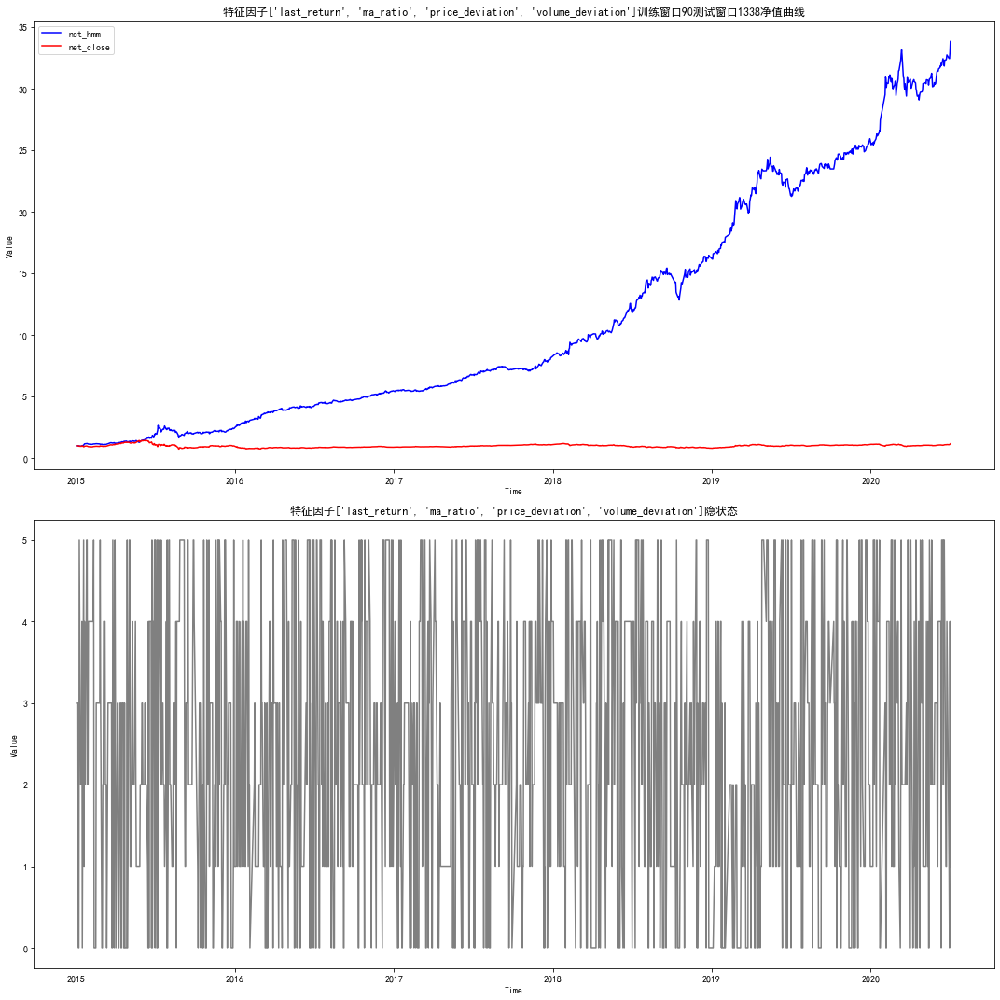

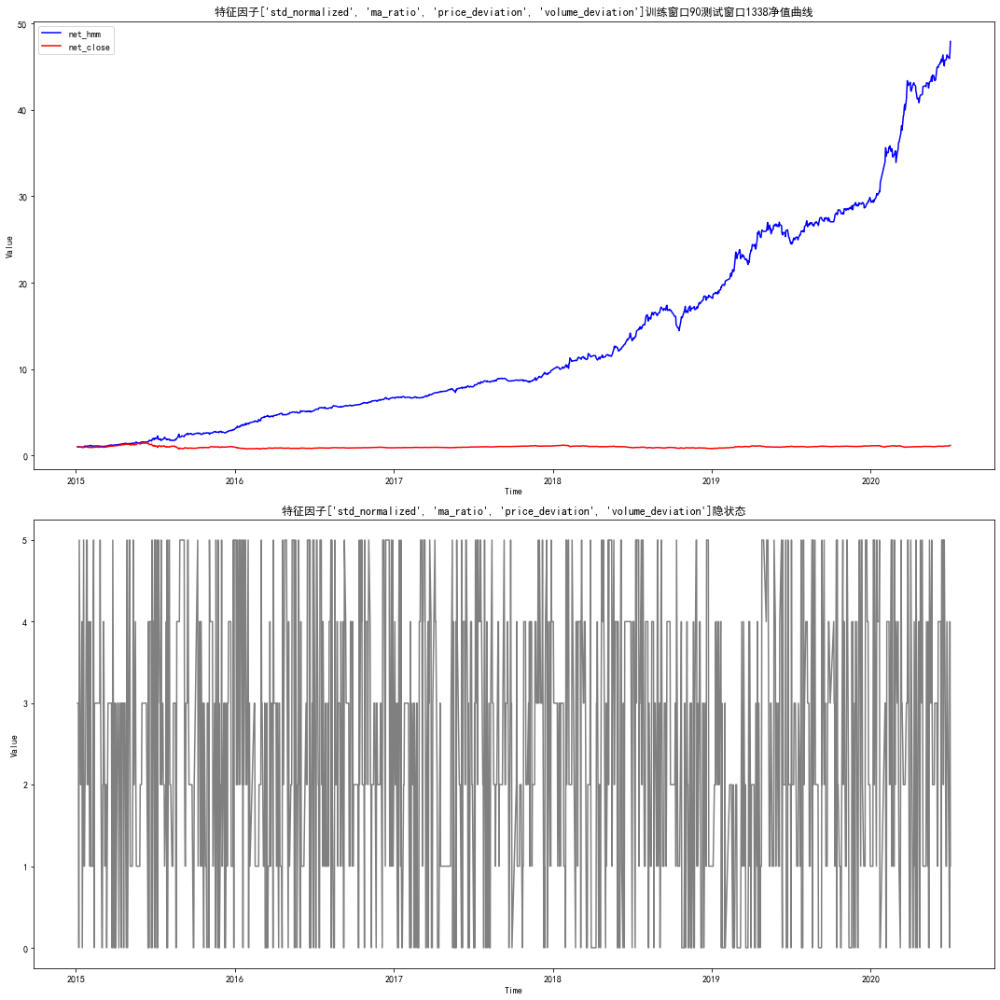

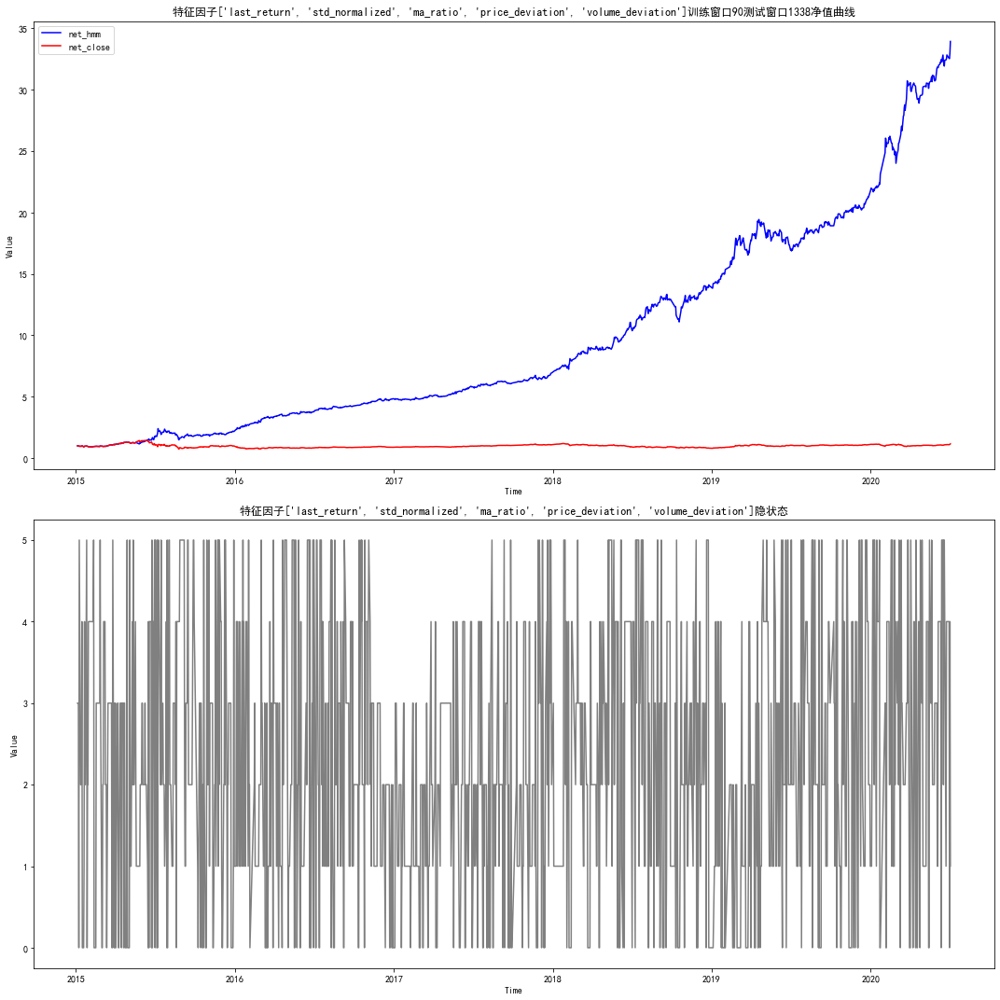

In [183]:
all_feature_lst = PowerSetsRecursive(cols_features)
all_feature_lst = [i for i in all_feature_lst if len(i)>0]
s_date = '2015-01-01'
data_set = dataset[dataset.index >= '2015-01-01'].dropna()
train_days = 90
test_days = len(in_sample_dataset)
for feature_lst in all_feature_lst:
    print('特征因子：', feature_lst, '训练窗口:', train_days)
    strategy_obj = HmmStrategy(s_date=s_date, max_states=max_states, leverage=1, fee=0.0002, data_set=data_set, 
                               cols_features=feature_lst, train_days=train_days, test_days=test_days, insample=True)
    strategy_obj.run_insample()

## 特征因子样本外回测

### 样本外不同滚动窗口回测，参数敏感性测试

特征因子： ['price_deviation'] 训练窗口: 60 测试窗口: 60
年化收益: 0.185421263953103
夏普比率: 0.5836603182058215
最大回撤: 0.4240423913966045
特征因子： ['price_deviation'] 训练窗口: 60 测试窗口: 120
年化收益: 0.5700666612043117
夏普比率: 1.57186293146861
最大回撤: 0.33445275750725345
特征因子： ['price_deviation'] 训练窗口: 60 测试窗口: 180
年化收益: 0.18174337218331438
夏普比率: 0.5822220889637866
最大回撤: 0.5037430893969486
特征因子： ['price_deviation'] 训练窗口: 60 测试窗口: 240
年化收益: 0.3782844371834777
夏普比率: 1.126970021463496
最大回撤: 0.33445275750725323
特征因子： ['price_deviation'] 训练窗口: 60 测试窗口: 300
年化收益: 0.003278712366934
夏普比率: 0.01117795582349949
最大回撤: 0.5840753300448821
特征因子： ['price_deviation'] 训练窗口: 60 测试窗口: 360
年化收益: 0.4433691119402323
夏普比率: 1.272112482177575
最大回撤: 0.40872516384414714
特征因子： ['price_deviation'] 训练窗口: 60 测试窗口: 420
年化收益: 0.24652026393442994
夏普比率: 0.7585649439488419
最大回撤: 0.40872516384414714
特征因子： ['price_deviation'] 训练窗口: 60 测试窗口: 480
年化收益: 0.5698334011885116
夏普比率: 1.57952199502636
最大回撤: 0.40872516384414714
特征因子： ['price_deviation'] 训练窗口: 120 测试窗口:

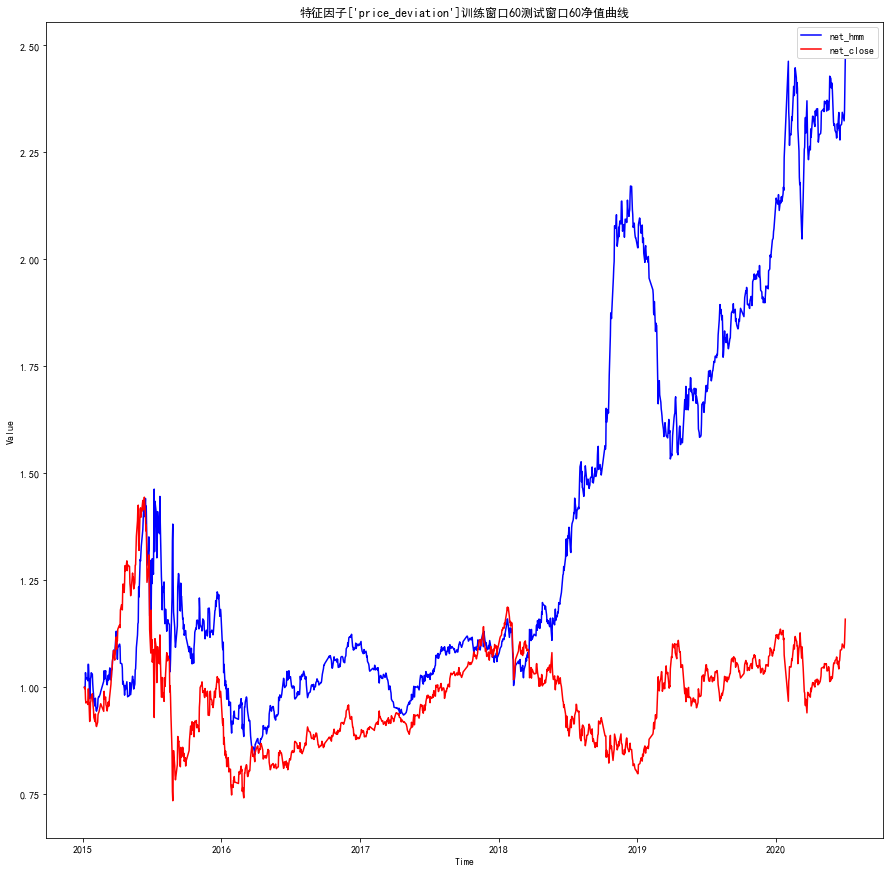

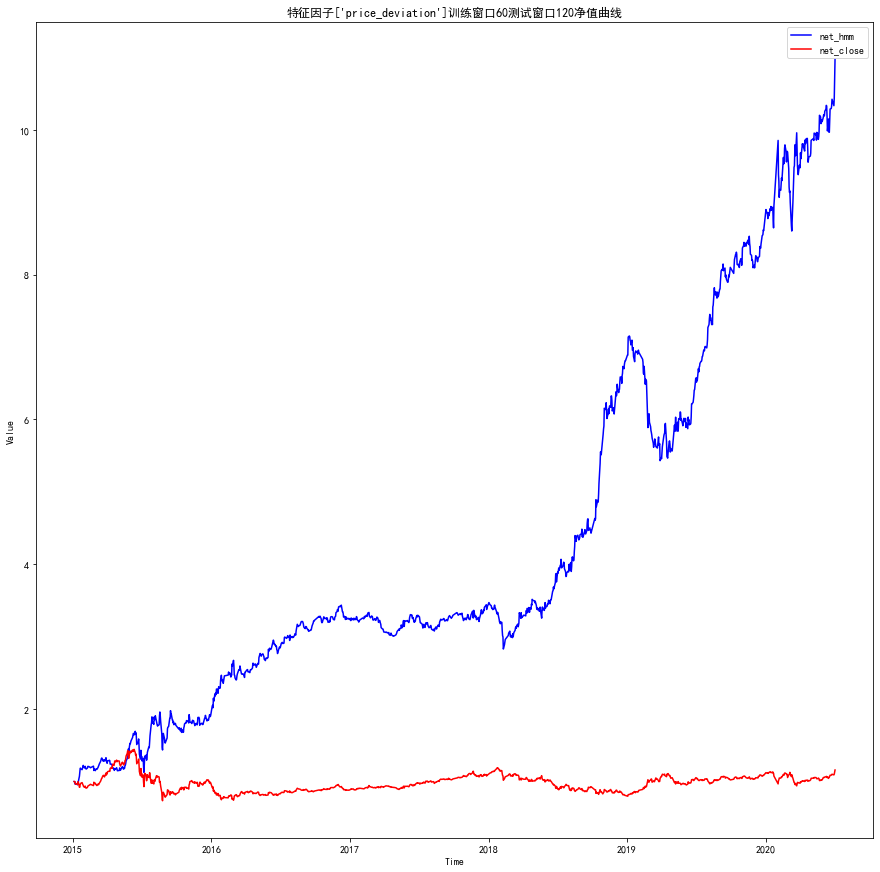

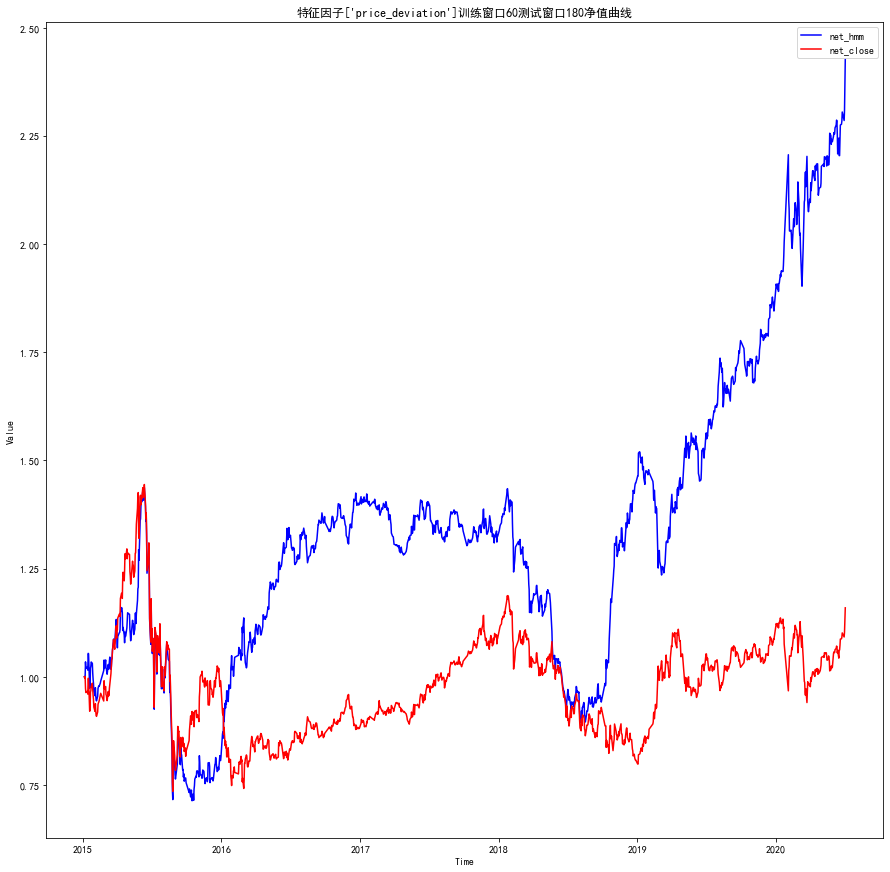

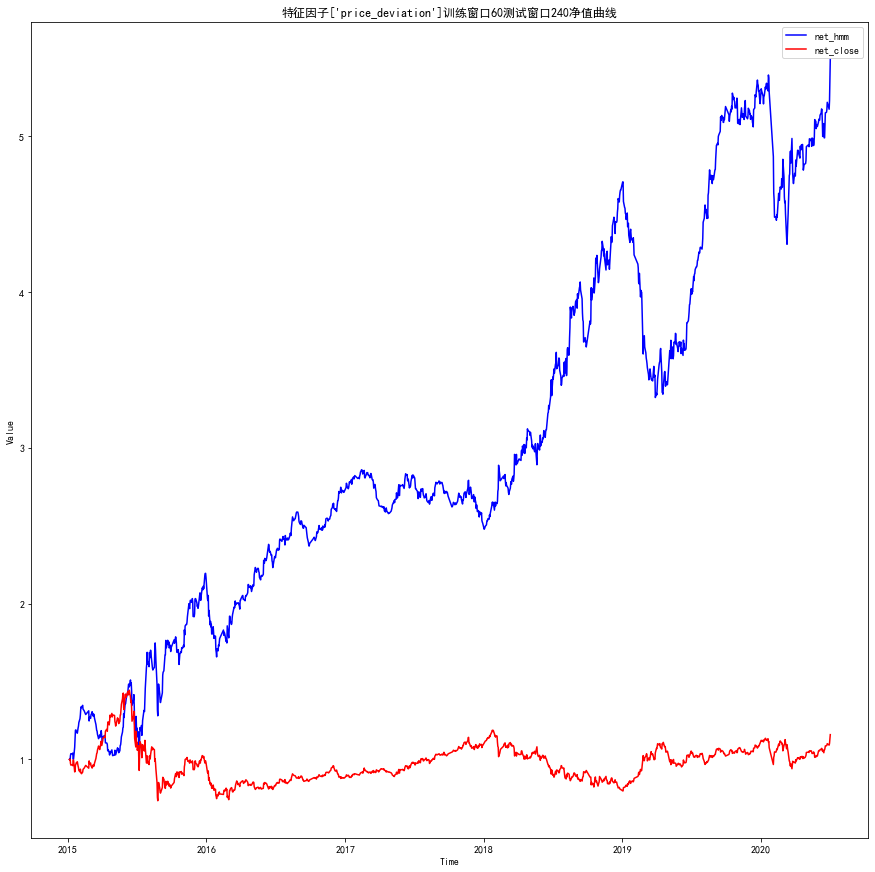

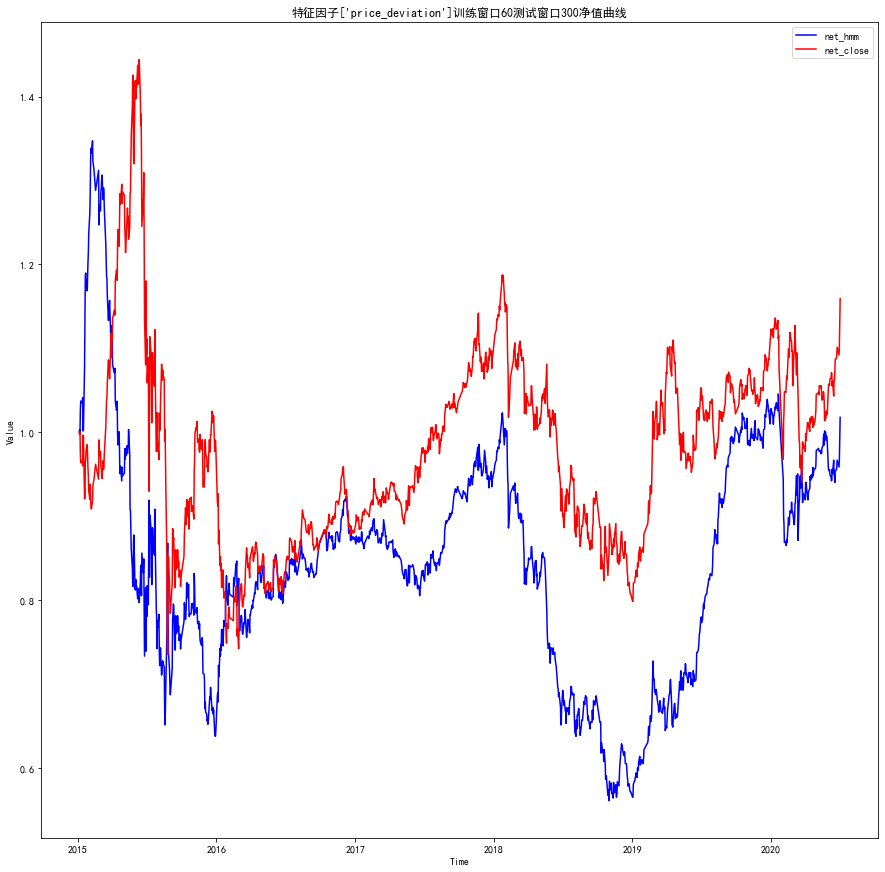

...

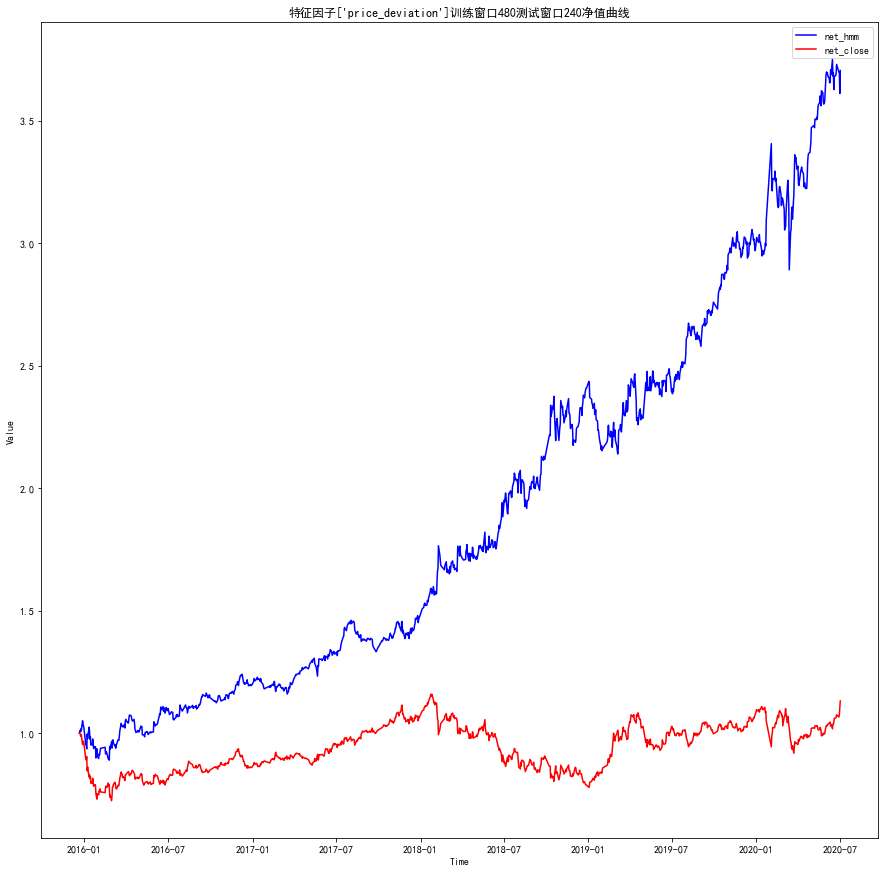

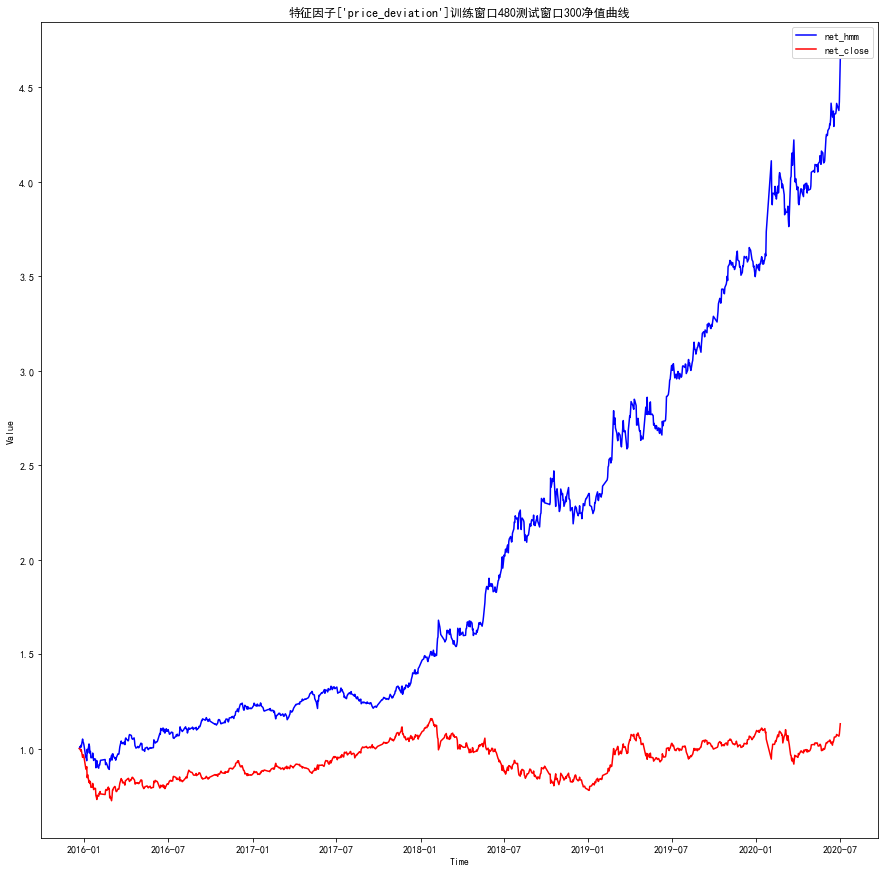

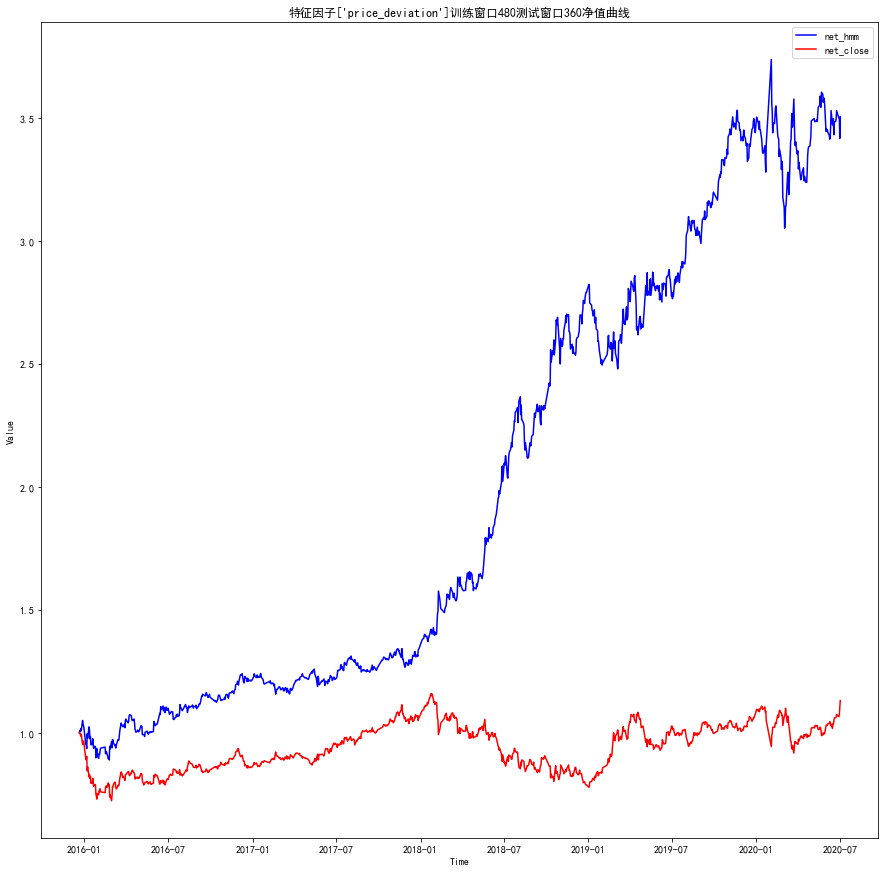

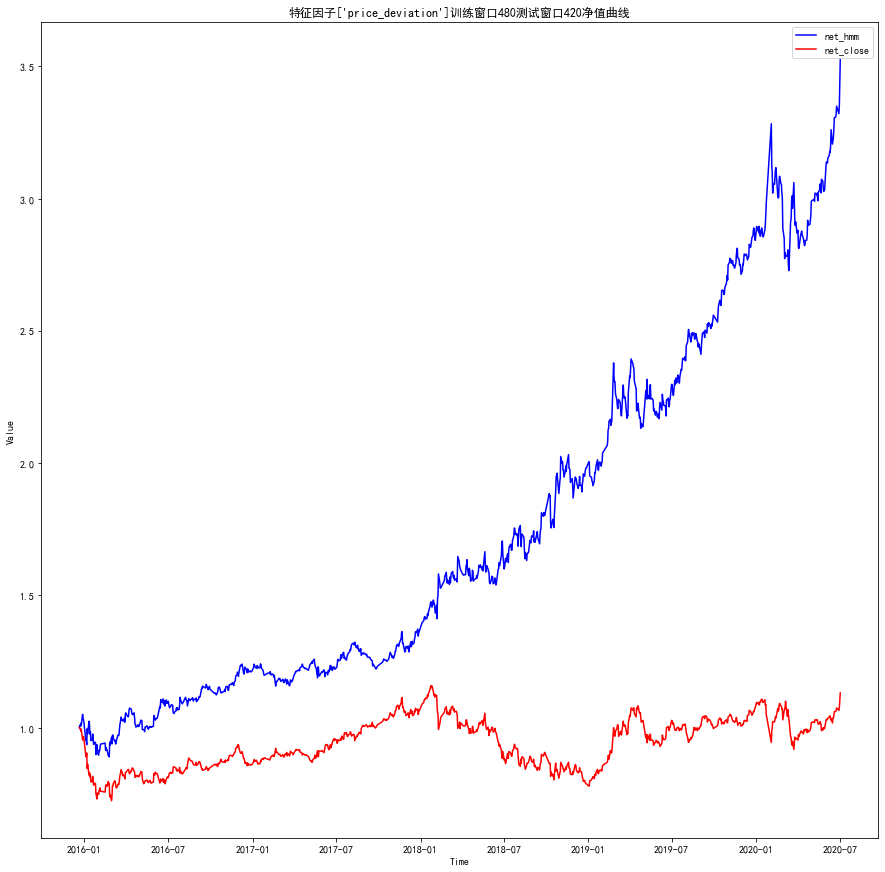

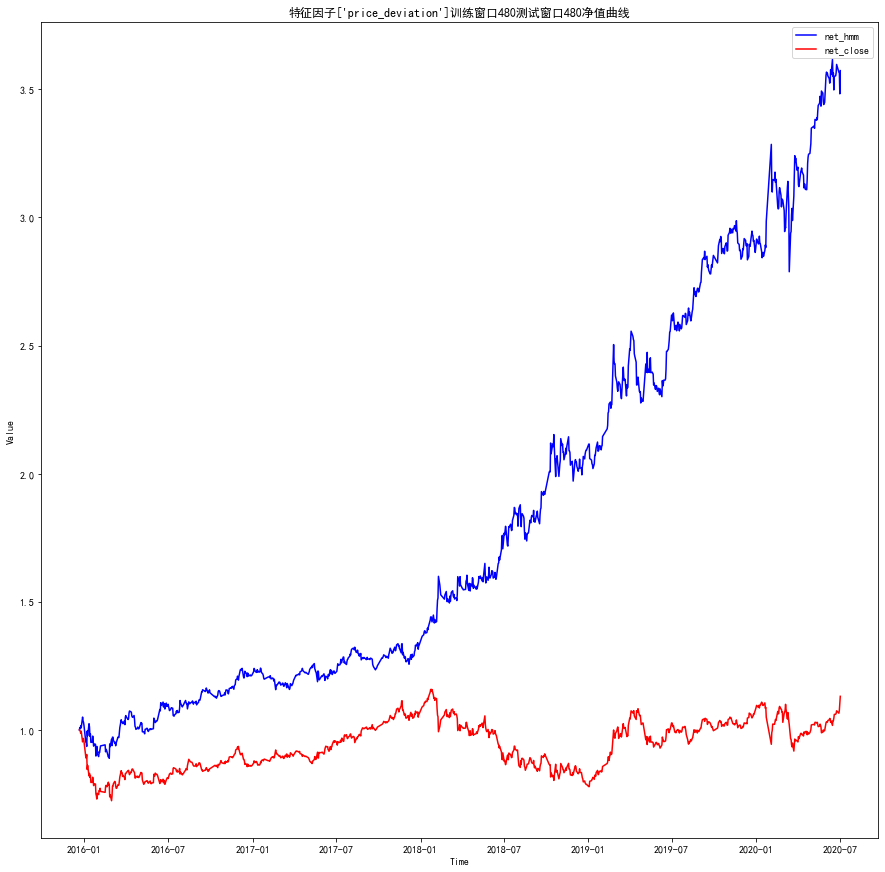

In [187]:
data_set = dataset[dataset.index >= '2014-01-01']
s_date = '2015-01-01'
train_s_date = '2015-01-01'
all_feature_lst = [['price_deviation']]
period_param_state = []
for feature_lst in all_feature_lst:
    for train_days in range(60, 500, 60):
        for test_days in range(60, 500, 60):
#             train_days = 300
#             test_days = len(in_sample_dataset)
            print('特征因子：', feature_lst, '训练窗口:', train_days, '测试窗口:', test_days)
            strategy_obj = HmmStrategy(s_date='2015-01-01', max_states=max_states, leverage=1, fee=0.0002, data_set=data_set, 
                                       cols_features=feature_lst, train_days=train_days, test_days=test_days, insample=False)
            annR, sharp, max_retrace = strategy_obj.run_outsample()
            print('年化收益: ' + str(annR))
        print('夏普比率: ' + str(sharp))
        print('最大回撤: ' + str(max_retrace))
            period_param_state.append([feature_lst, train_days, test_days, annR, sharp, max_retrace])
period_param_state_df = pd.DataFrame(
    period_param_state, columns=['特征因子', '训练窗口', '测试窗口', '年化收益', '夏普比率', '最大回撤'])
print(period_param_state_df)

### 样本外不同特征因子回测（训练窗口: 150 测试窗口: 60）

特征因子： ['last_return'] 训练窗口: 150 测试窗口: 60
年化收益: -0.09500607235690983
夏普比率: -0.3527195318027687
最大回撤: 0.5939988373087672
特征因子： ['std_normalized'] 训练窗口: 150 测试窗口: 60
年化收益: -0.09936649715852908
夏普比率: -0.3629107457463056
最大回撤: 0.6042779992155893
特征因子： ['last_return', 'std_normalized'] 训练窗口: 150 测试窗口: 60
年化收益: -0.03321847910620401
夏普比率: -0.11610730044906599
最大回撤: 0.44436048051225074
特征因子： ['ma_ratio'] 训练窗口: 150 测试窗口: 60
年化收益: -0.04903735046905866
夏普比率: -0.1759173766990189
最大回撤: 0.49683796089600885
特征因子： ['last_return', 'ma_ratio'] 训练窗口: 150 测试窗口: 60
年化收益: -0.06376323845730836
夏普比率: -0.23270917716831266
最大回撤: 0.5138281724136091
特征因子： ['std_normalized', 'ma_ratio'] 训练窗口: 150 测试窗口: 60
年化收益: -0.01928188768631256
夏普比率: -0.06803415951190259
最大回撤: 0.4665989891909861
特征因子： ['last_return', 'std_normalized', 'ma_ratio'] 训练窗口: 150 测试窗口: 60
年化收益: -0.08763040517539245
夏普比率: -0.319332391899955
最大回撤: 0.5761188688727821
特征因子： ['price_deviation'] 训练窗口: 150 测试窗口: 60
年化收益: 0.29603993677074003
夏普比率: 0.900007043

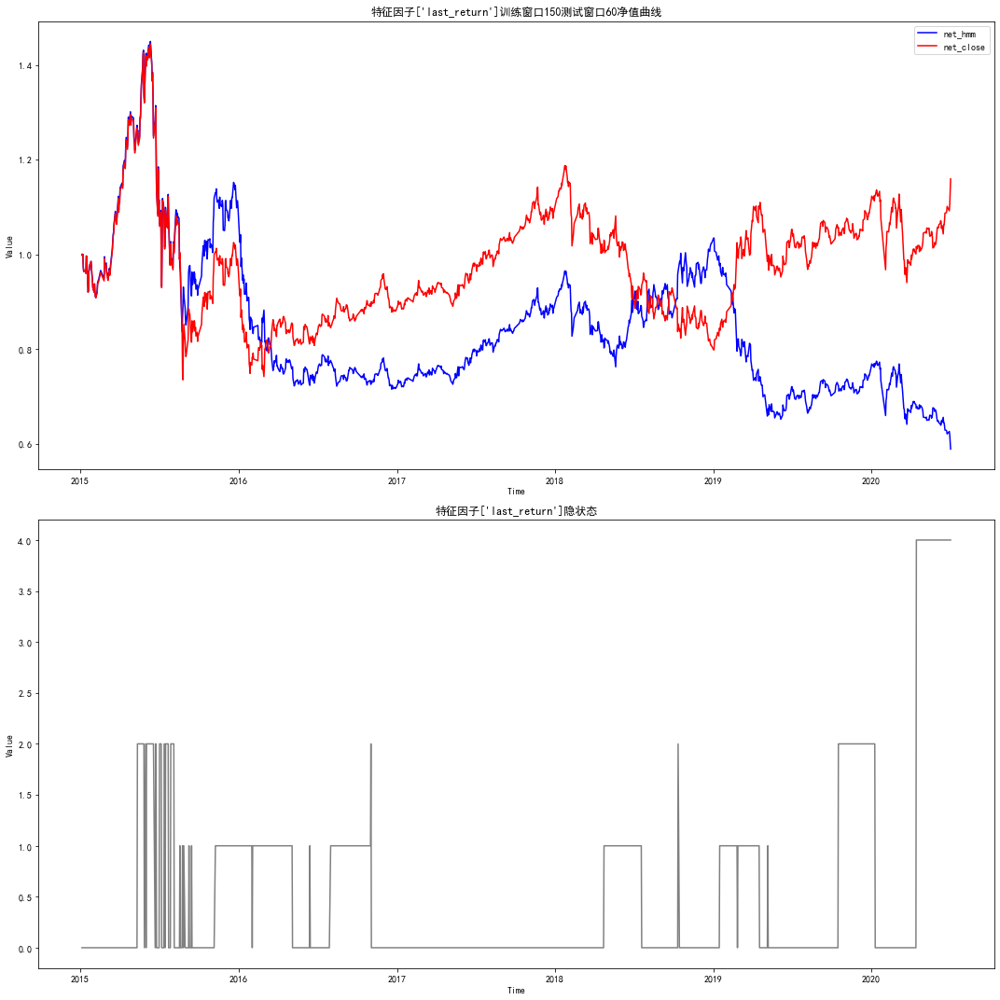

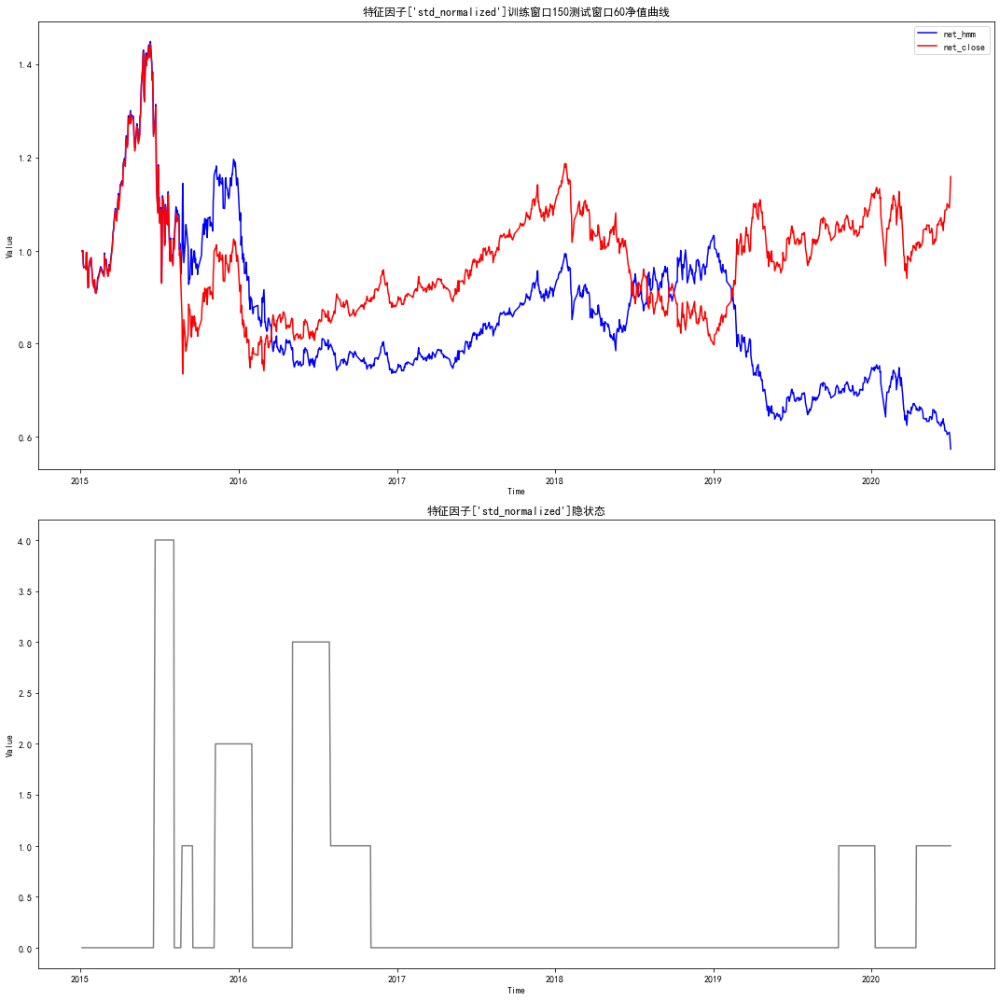

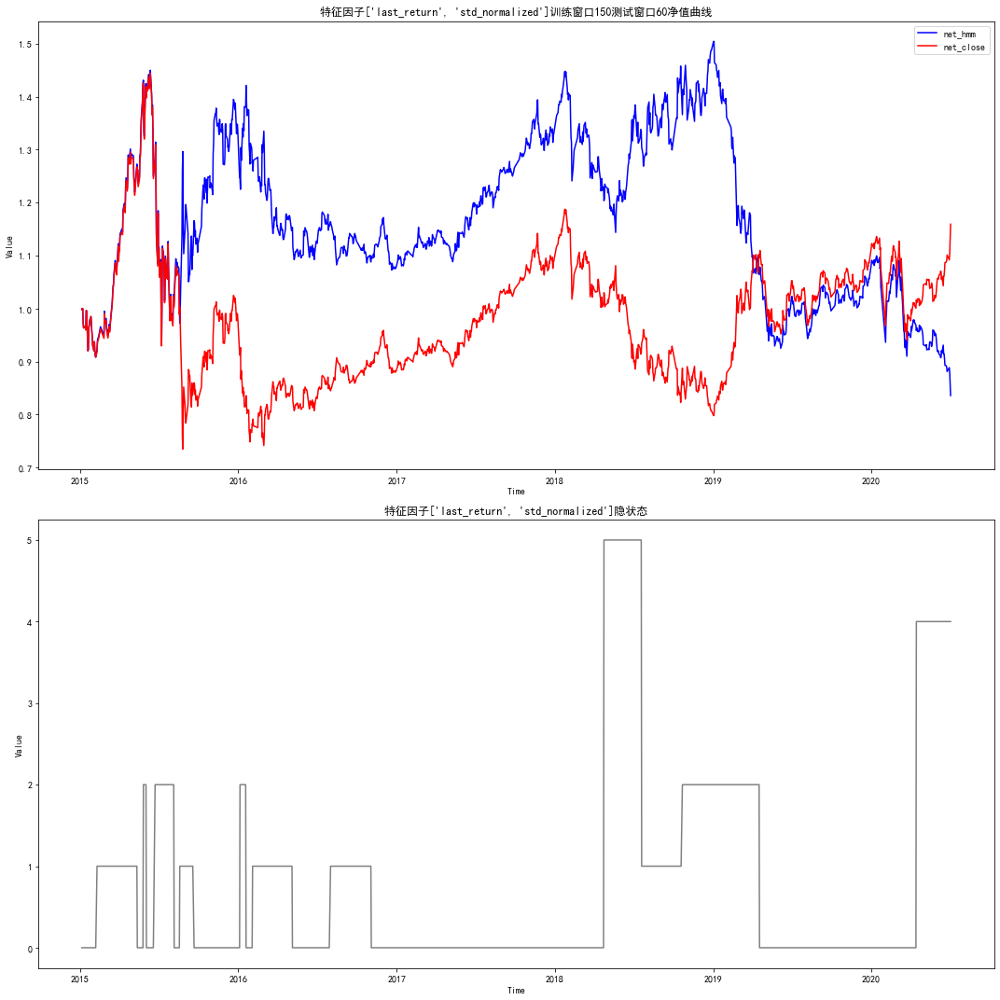

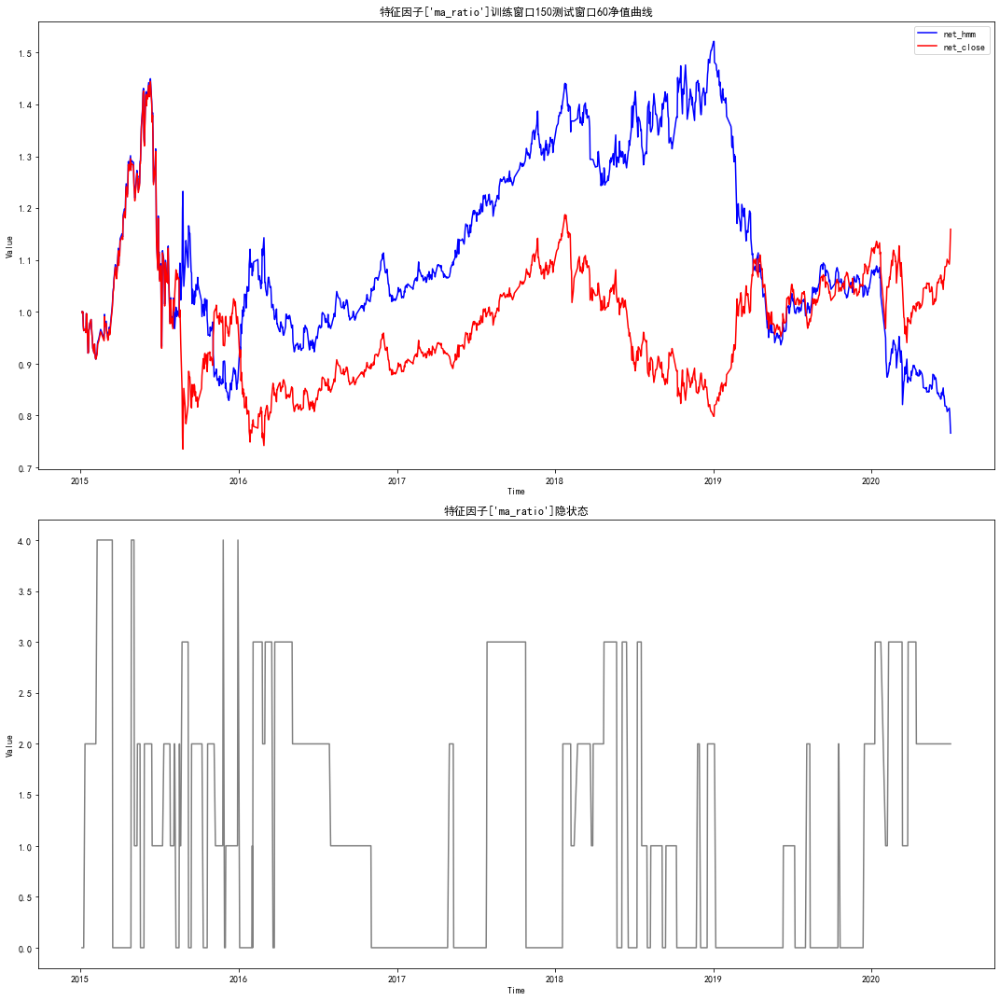

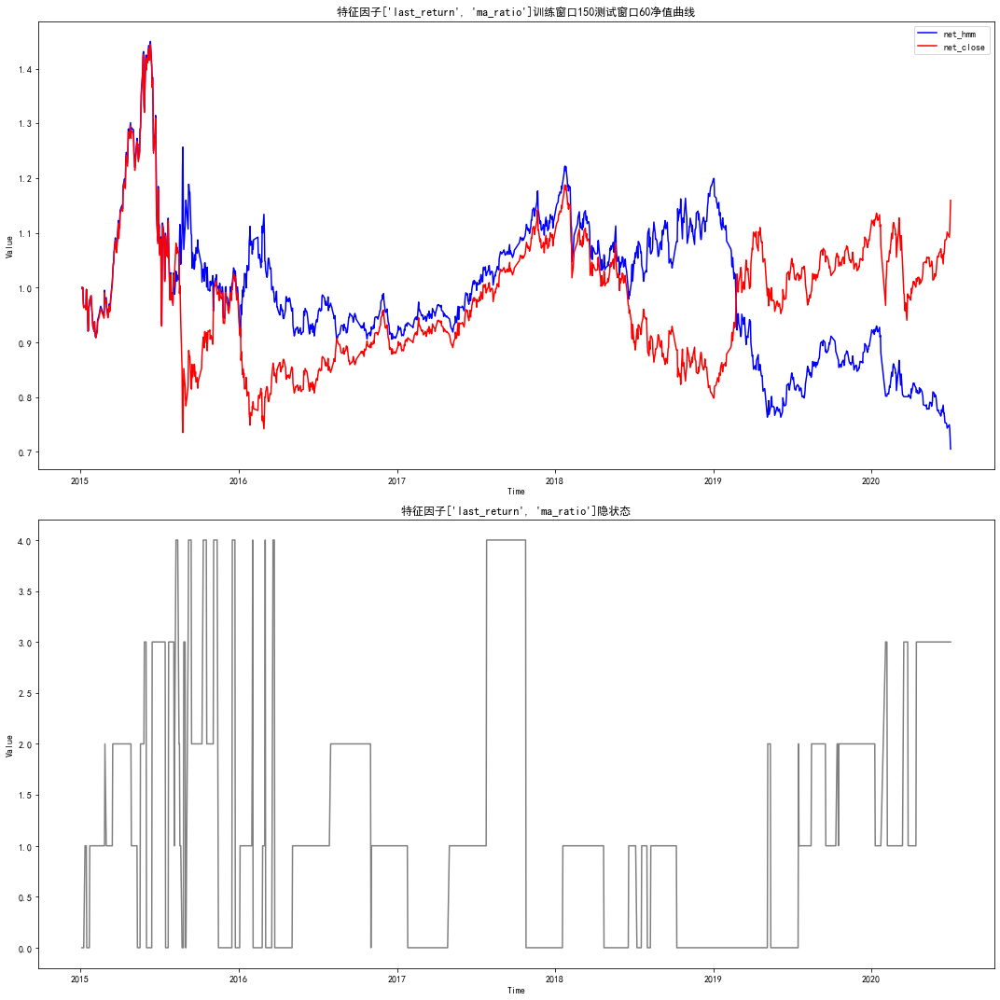

...

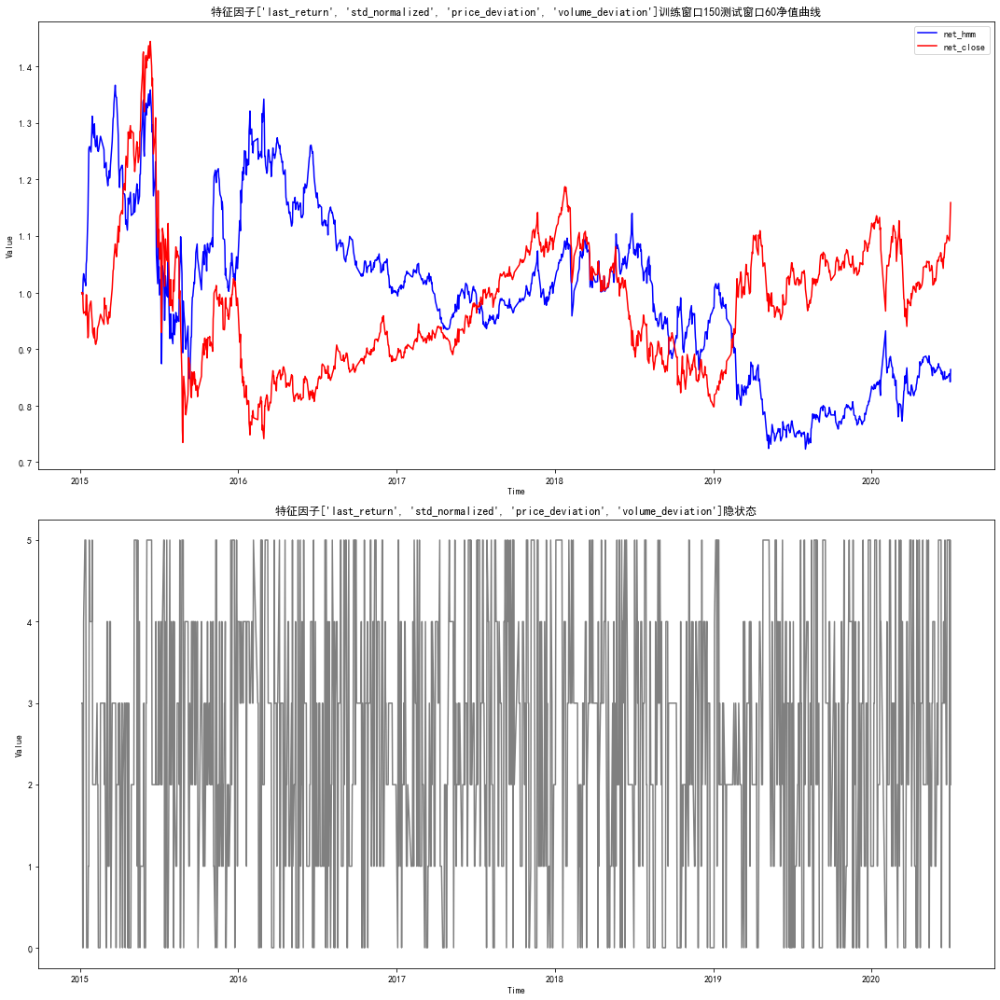

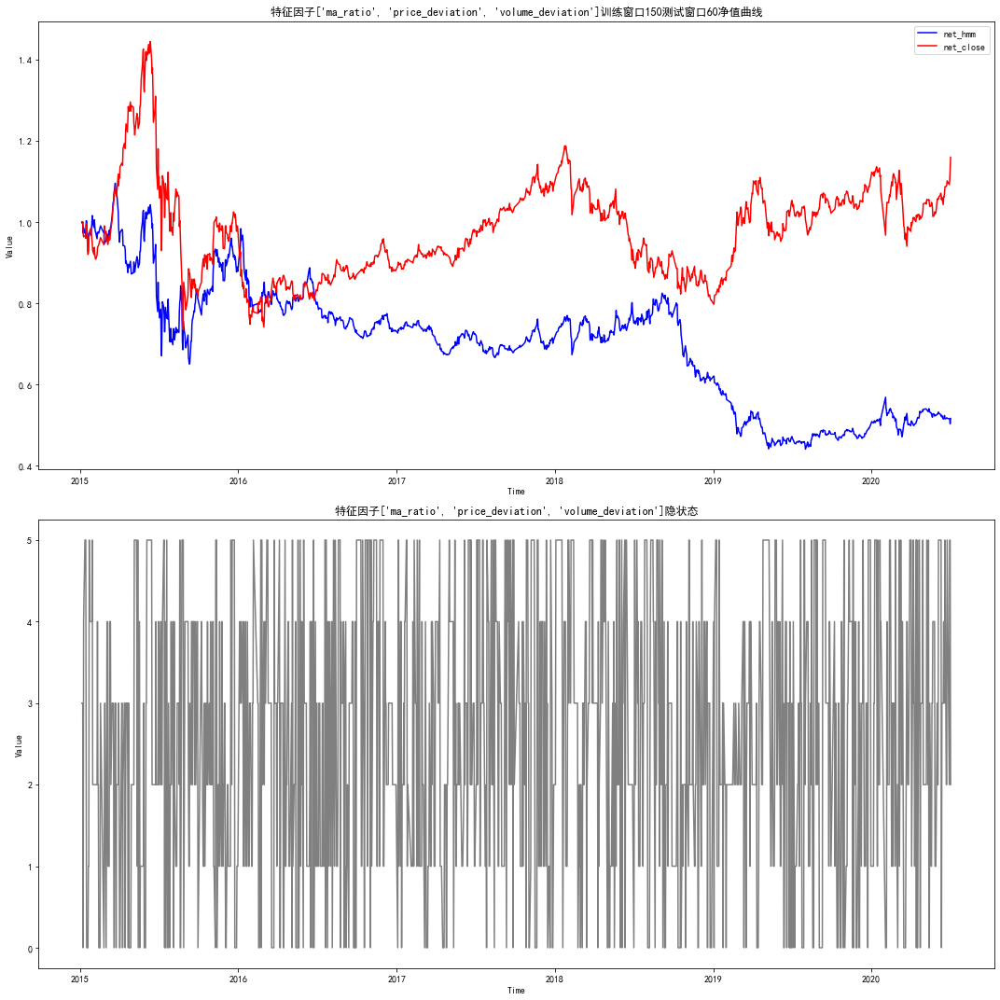

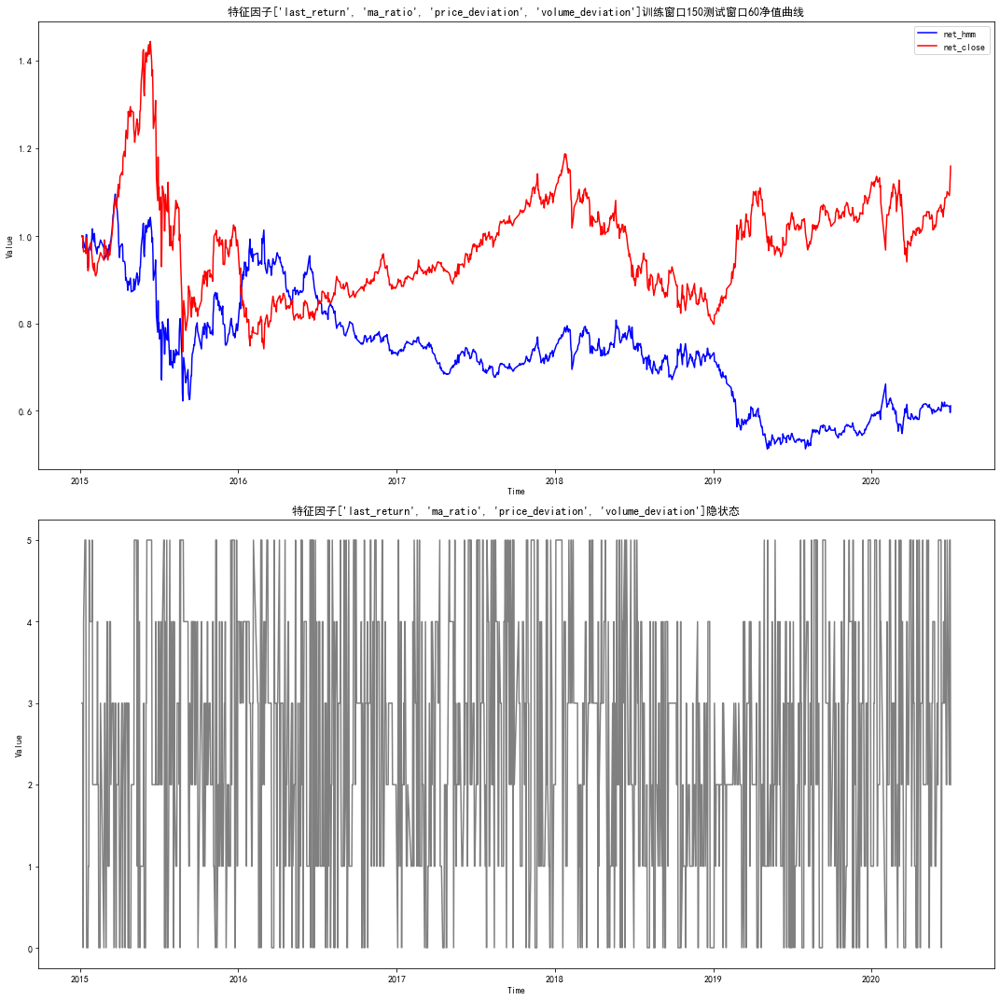

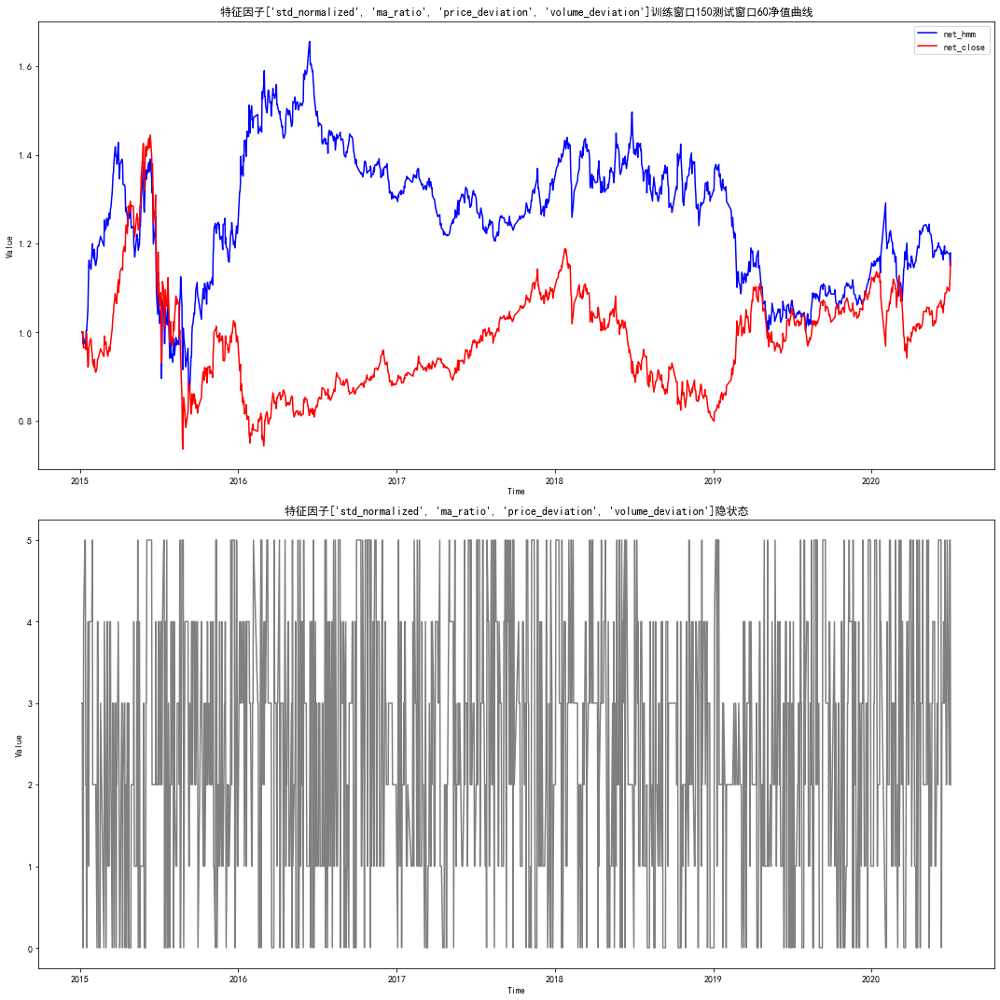

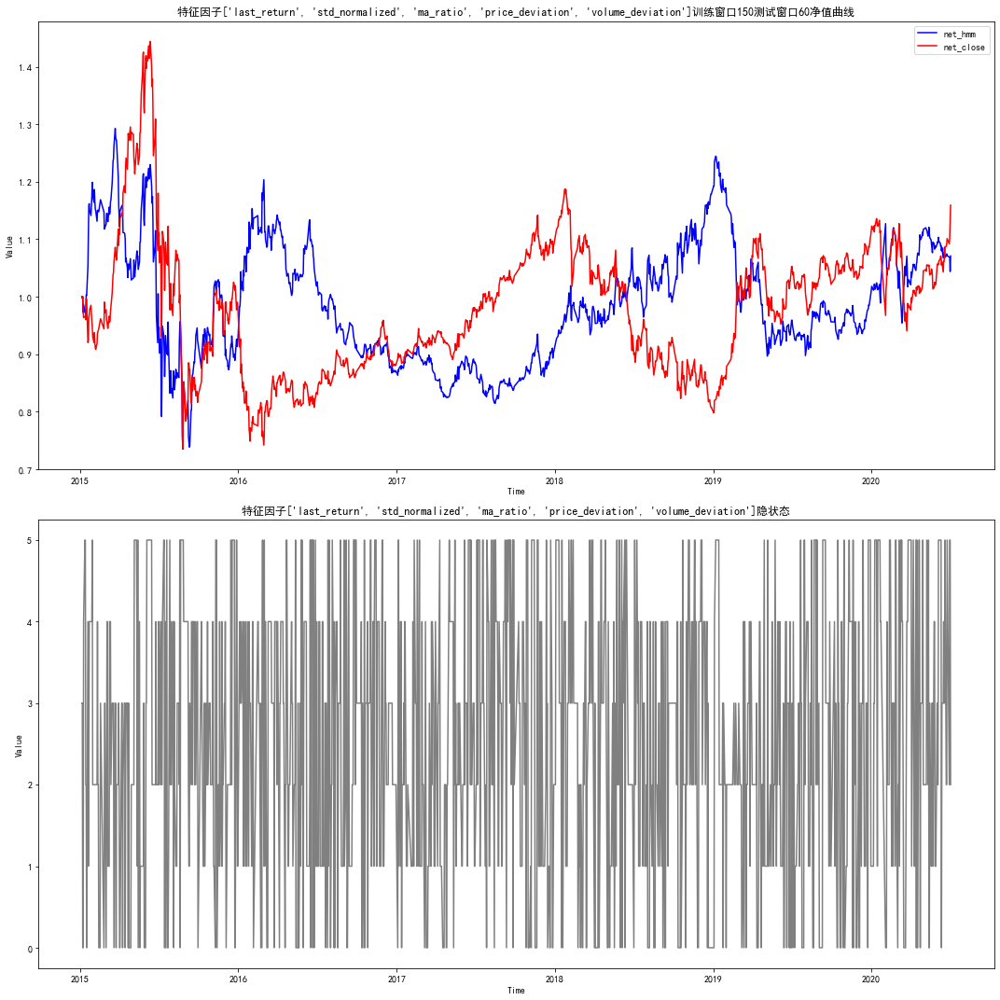

In [185]:
s_date = '2015-01-01'
train_s_date = '2014-01-01'
data_set = dataset[dataset.index >= train_s_date]
all_feature_lst = PowerSetsRecursive(cols_features)
all_feature_lst = [i for i in all_feature_lst if len(i)>0]
for feature_lst in all_feature_lst:
    for train_days in range(150, 500, 10000):
        for test_days in range(60, 500, 10000):
#             train_days = 300
#             test_days = len(in_sample_dataset)
            print('特征因子：', feature_lst, '训练窗口:', train_days, '测试窗口:', test_days)
            strategy_obj = HmmStrategy(s_date=s_date, max_states=max_states, leverage=1, fee=0.0002, data_set=data_set, 
                                       cols_features=feature_lst, train_days=train_days, test_days=test_days, insample=False)
            strategy_obj.run_outsample()

In [354]:
dataset = dataset.dropna()

In [355]:
dataset

,last_return,std_normalized,ma_ratio,price_deviation,volume_deviation,future_return,high,low,close,volume,open,date_time,close_1
Date,,,,,,,,,,,,,
2017-01-11,-0.014074,0.074583,-0.084358,-1.043067,-0.723571,0.003034,918.00,895.48,905.750000,12138.492906,903.010000,2017-01-11,903.010000
2017-01-12,0.003034,0.078397,-0.074358,-0.882834,-0.940678,-0.139321,923.66,760.00,779.560000,62866.223071,905.750000,2017-01-12,905.750000
2017-01-13,-0.139321,0.099824,-0.220088,-1.807045,0.925042,0.032621,831.18,735.00,804.990000,35863.467828,779.560000,2017-01-13,779.560000
2017-01-14,0.032621,0.108756,-0.154898,-1.233238,-0.236870,0.027615,832.39,775.61,827.220000,25871.211334,804.990000,2017-01-14,804.990000
2017-01-15,0.027615,0.108145,-0.098381,-0.828234,-0.738535,-0.013745,838.54,800.03,815.850000,12533.896904,827.220000,2017-01-15,827.220000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-29,-0.033836,0.043615,0.026859,0.632805,0.624957,0.014357,13629.00,12972.00,13450.000000,3997.730829,13259.636970,2020-10-29,13259.636970
2020-10-30,0.014357,0.033452,0.028178,0.866776,-0.569502,0.009442,13673.00,13120.00,13577.000000,4558.961015,13450.000000,2020-10-30,13450.000000
2020-10-31,0.009442,0.018867,0.025219,1.371247,-0.370846,0.020770,14055.00,13425.00,13859.000000,9057.493287,13577.000000,2020-10-31,13577.000000


In [356]:
# Split the data on sets
train_edate = '2020-11-01 00:00:00'
train_ind = int(np.where(dataset.index == train_edate)[0])
train_set = dataset[cols_features].values[:train_ind]
test_set = dataset[cols_features].values[train_ind:]
test_df = dataset[train_ind:]


In [357]:
train_ind

141

<Figure size 1440x720 with 0 Axes>

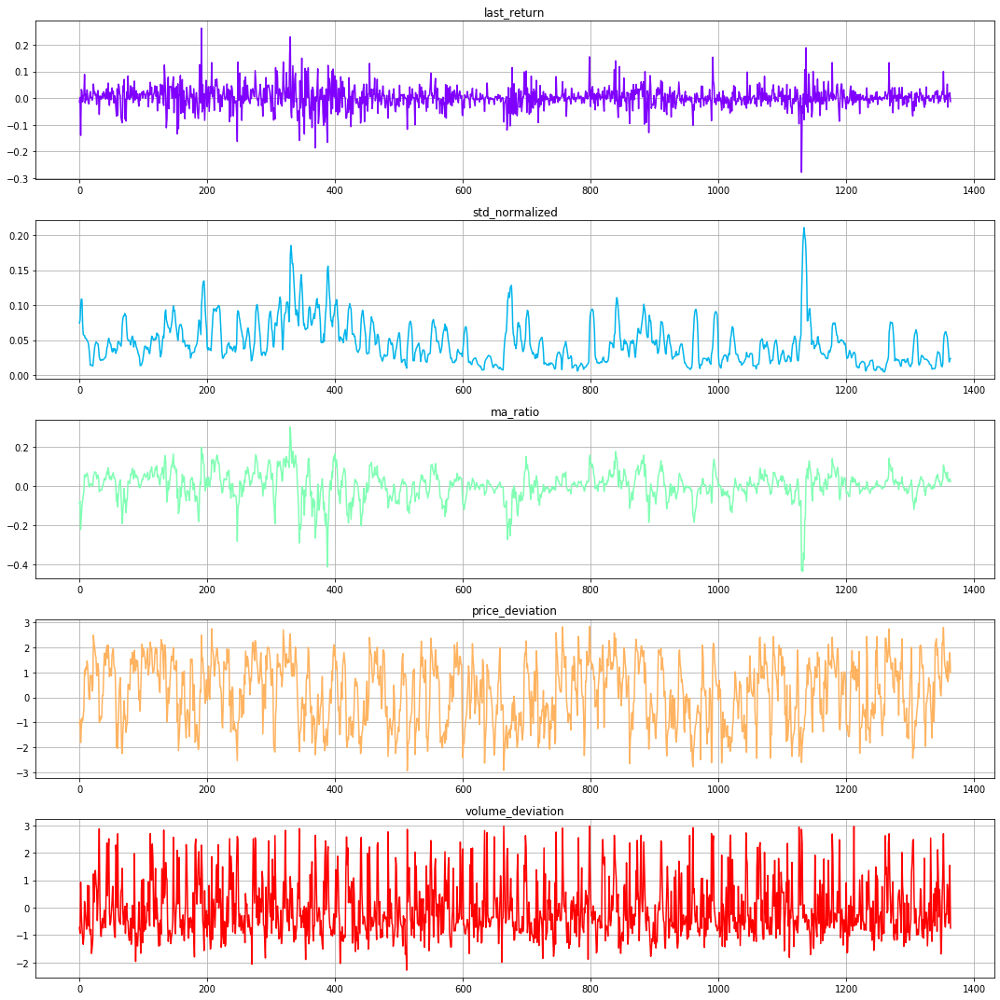

In [358]:
 # Plot features 五个新的时间序列
plt.figure(figsize=(20, 10))
fig, axs = plt.subplots(len(cols_features), 1, figsize=(15, 15))
colours = cm.rainbow(np.linspace(0, 1, len(cols_features)))
for i in range(0, len(cols_features)):
    axs[i].plot(dataset.reset_index()[cols_features[i]], color=colours[i])
    axs[i].set_title(cols_features[i])
    axs[i].grid(True)

plt.tight_layout()

In [359]:
# General plots of hidden states
def plot_hidden_states(model, data, X, column_price):
    plt.figure(figsize=(15, 15))
    fig, axs = plt.subplots(model.n_components, 3, figsize=(15, 15))
    colours = cm.prism(np.linspace(0, 1, model.n_components))
    hidden_states = model.predict(X)
    print(hidden_states)
    for i, (ax, colour) in enumerate(zip(axs, colours)):
        mask = hidden_states == i
#         print(mask)
#         print(data['future_return'][mask])
        ax[0].plot(data.index, data[column_price], c='grey')
        ax[0].plot(data.index[mask], data[column_price][mask], '.', c=colour)
        ax[0].set_title('{0}th hidder state'.format(i))
        ax[0].grid(True)

        ax[1].hist(data['future_return'][mask], bins=30)
        ax[1].set_xlim([-0.1, 0.1])
        ax[1].set_title('future return distrbution at {0}th hidder state'.format(i))
        ax[1].grid(True)

        ax[2].plot(data['future_return'][mask].cumsum(), c=colour)
        ax[2].set_title('cummulative future return at {0}th hidden state'.format(i))
        ax[2].grid(True)
    plt.tight_layout()

In [360]:
hidden_state_num = 6
model = get_best_hmm_model(train_set, hidden_state_num)

In [361]:
model.n_components

6

[0 0 5 0 0 0 0 4 1 1 1 1 1 1 4 4 4 4 4 4 4 4 3 3 3 3 3 1 1 1 1 5 0 0 0 0 4
 4 1 3 3 1 3 3 3 3 3 1 1 1 1 3 3 3 1 1 1 5 5 0 5 0 4 4 4 5 5 5 0 0 4 5 0 5
 0 0 4 4 4 4 1 1 1 3 1 1 3 1 1 1 1 1 1 4 4 4 4 3 3 3 3 3 3 1 1 1 3 3 1 1 1
 3 3 3 3 1 1 1 3 3 3 3 1 1 1 4 4 3 3 3 3 1 2 2 2 2 5 5 0 4 4]


<Figure size 1080x1080 with 0 Axes>

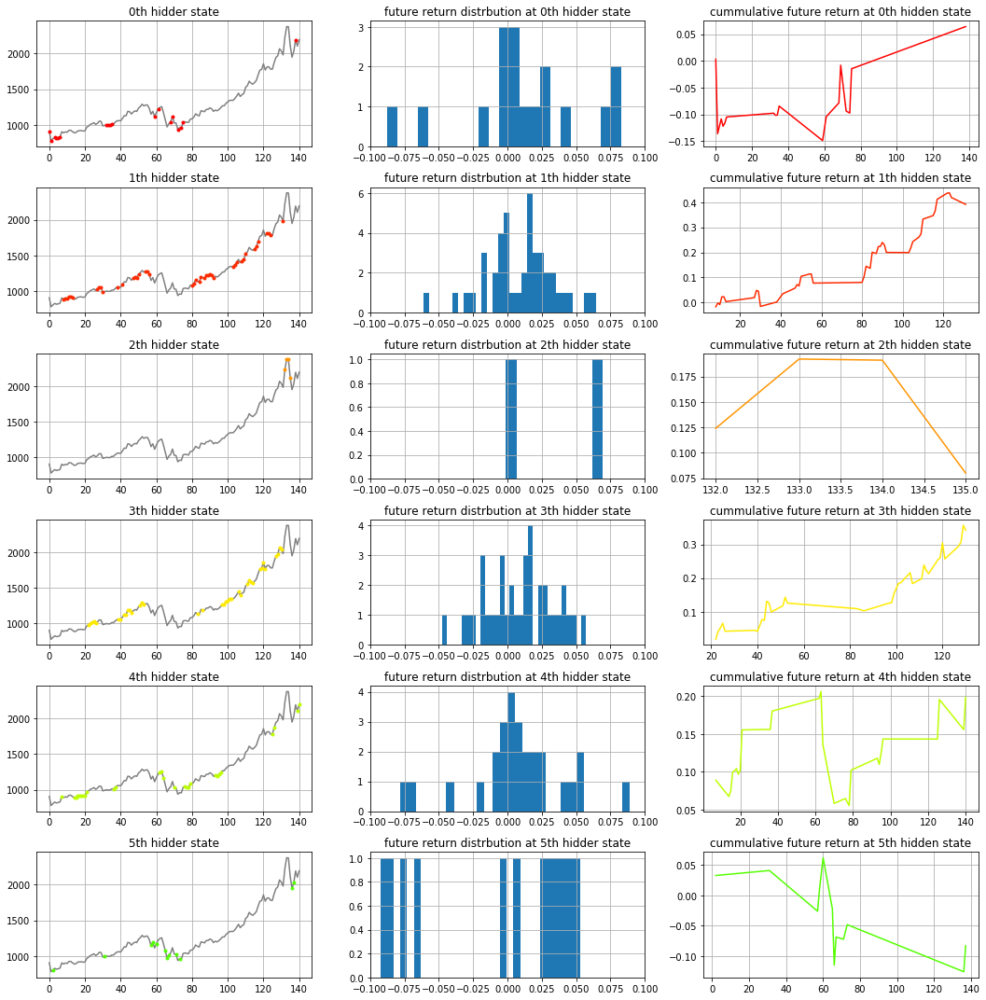

In [362]:
plot_hidden_states(model, dataset[:train_ind].reset_index(), train_set, column_price)

In [317]:
# 第二个关键 是通过特征来研究每个状态。
# 在此之后，我们可以将这两个事件（未来走势和当前状态）联系起来。
# 让我们为每个状态的特征编写代码和可视化。
def mean_confidence_interval(vals, confidence):
    a = 1.0 * np.array(vals)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m-h, m, m+h


def compare_hidden_states(hmm_model, cols_features, conf_interval, iters=1000):
    plt.figure(figsize=(15, 15))
    fig, axs = plt.subplots(len(cols_features), hmm_model.n_components, figsize=(15, 15))
    colours = cm.prism(np.linspace(0, 1, hmm_model.n_components))
    for i in range(0, hmm_model.n_components):
        mc_df = pd.DataFrame()

        # Samples generation
        for j in range(0, iters):
            row = np.transpose(hmm_model._generate_sample_from_state(i))
            mc_df = mc_df.append(pd.DataFrame(row).T)
        mc_df.columns = cols_features
        for k in range(0, len(mc_df.columns)):
            axs[k][i].hist(mc_df[cols_features[k]], color=colours[i])
            axs[k][i].set_title(cols_features[k] + ' (state ' + str(i) + '): ' +
                                str(np.round(mean_confidence_interval(mc_df[cols_features[k]], conf_interval), 3)))
            axs[k][i].grid(True)
    plt.tight_layout()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:29: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


<Figure size 1080x1080 with 0 Axes>

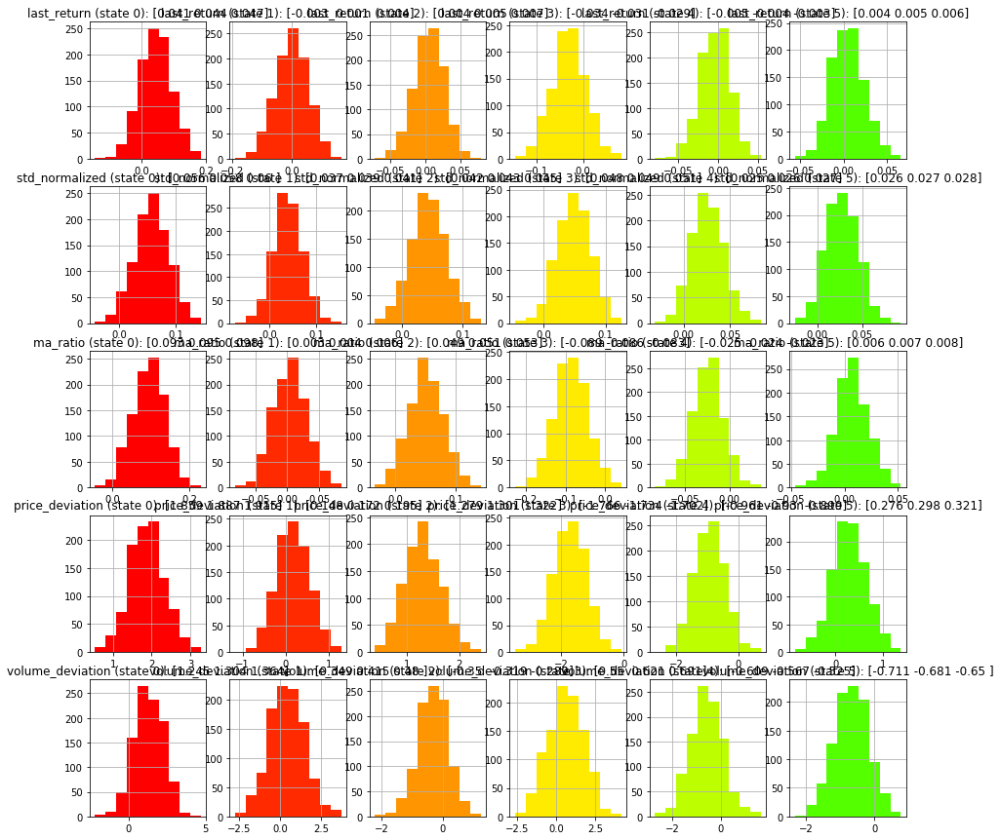

In [318]:
compare_hidden_states(hmm_model=model, cols_features=cols_features, conf_interval=0.95)

In [319]:
# 搭建策略
# 状态为#0时： 做空
# 状态为#1时： 空仓
# 状态为#2时： 做多

In [320]:
dataset[:train_ind]


,last_return,std_normalized,ma_ratio,price_deviation,volume_deviation,future_return,high,low,close,volume,open,date_time,close_1
Date,,,,,,,,,,,,,
2019-01-14,-0.032798,0.048200,-0.096344,-1.823194,-0.587773,0.047458,3799.400000,3580.000000,3749.900000,14822.060969,3580.0,2019-01-14,3580.0
2019-01-15,0.047458,0.050140,-0.041150,-0.788274,-0.122836,-0.025067,3780.874734,3623.100000,3655.900000,13293.390883,3749.9,2019-01-15,3749.9
2019-01-16,-0.025067,0.052014,-0.056840,-1.034008,-0.335720,0.006811,3759.894844,3642.358936,3680.800000,13119.247466,3655.9,2019-01-16,3655.9
2019-01-17,0.006811,0.053447,-0.042110,-0.756049,-0.372452,0.009319,3725.000000,3606.200000,3715.100000,10673.827380,3680.8,2019-01-17,3680.8
2019-01-18,0.009319,0.054046,-0.027219,-0.490274,-0.805975,-0.010268,3723.900000,3652.388368,3676.953079,5648.970498,3715.1,2019-01-18,3715.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,0.002909,0.028626,0.003890,0.136422,-0.432810,0.005206,7300.000000,7113.300000,7278.700000,3983.951890,7241.0,2019-12-27,7241.0
2019-12-28,0.005206,0.013429,0.000647,0.048192,-0.461215,0.008229,7390.000000,7279.200000,7338.600000,2568.077737,7278.7,2019-12-28,7278.7
2019-12-29,0.008229,0.013569,0.008546,0.635256,-1.218717,0.010533,7551.600000,7311.600000,7415.900000,2488.165365,7338.6,2019-12-29,7338.6


No handles with labels found to put in legend.


annR: -0.583952116423315
sharp: -1.8182511690125356
Max drawdown: 0.5981441413632591


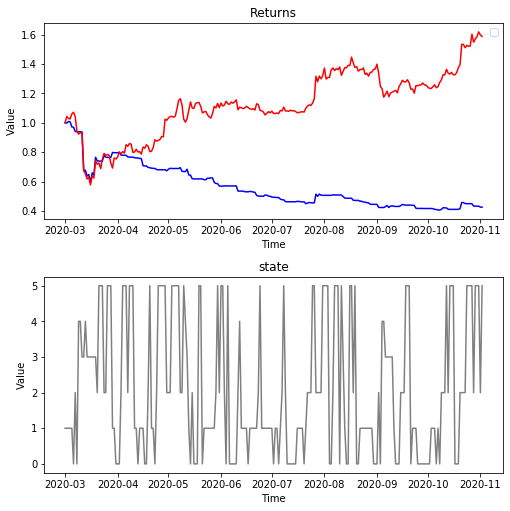